In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import zscore
#from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from sklearn.model_selection import train_test_split
import itertools
import os
from datetime import datetime
#from phik.report import plot_correlation_matrix
#from patsy import dmatrices
#from statsmodels.stats.outliers_influence import variance_inflation_factor
#from featurewiz import featurewiz
#from optbinning import BinningProcess
from sklearn.metrics import classification_report
# import openpyxl
#from pycaret.classification import *
# import re
# from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, balanced_accuracy_score, mean_squared_error, mean_absolute_percentage_error, mean_absolute_error, r2_score, confusion_matrix, f1_score, roc_auc_score, precision_score, recall_score, roc_curve, auc
# from sklearn.tree import DecisionTreeClassifier, plot_tree
# from sklearn.metrics import confusion_matrix, f1_score, roc_auc_score, precision_score, recall_score, roc_curve, auc
import pickle
# import jenkspy
# from openpyxl.drawing.image import Image
# from openpyxl import load_workbook
# from imblearn.over_sampling import SMOTE
# from collections import Counter
from keras.models import load_model

c:\Users\Alessandro\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\Alessandro\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
c:\Users\Alessandro\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
c:\Users\Alessandro\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\.libs\libopenblas64__v0.3.23-246-g3d31191b-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:,.2f}'.format
sns.set()

In [3]:
file_path = "Dataset Bitcoin+ con variazioni esteso da me (passato_1500, futuro_1, periodo originale dal 28-4-2013 al 4-3-2024).csv"
df = pd.read_csv(file_path)

In [4]:
df_bitcoin = df.copy()

In [5]:
df_bitcoin

variazione_presente variazione_passato_1 variazione_passato_2  \
0                      -                    +                    -   
1                      +                    -                    +   
2                      +                    +                    -   
3                      -                    +                    +   
4                      +                    -                    +   
...                  ...                  ...                  ...   
2455                   +                    +                    +   
2456                   +                    +                    +   
2457                   -                    +                    +   
2458                   +                    -                    +   
2459                   -                    +                    -   

     variazione_passato_3 variazione_passato_4 variazione_passato_5  \
0                       +                    +                    -   
1                       -                    +                    +   
2                       +                    -                    +   
3                       -                    +                    -   
4                       +                    -                    +   
...                   ...                  ...                  ...   
2455                    +                    -                    -   
2456                    +                    +                    -   
2457                    +                    +                    +   
2458                    +                    +                    +   
2459                    +                    +                    +   

     variazione_passato_6 variazione_passato_7 variazione_passato_8  \
0                       +                    +                    +   
1                       -                    +                    +   
2                       +                    -                    +   
3                       +                    +                    -   
4                       -                    +                    +   
...                   ...                  ...                  ...   
2455                    -                    +                    -   
2456                    -                    -                    +   
2457                    -                    -                    -   
2458                    +                    -                    -   
2459                    +                    +                    -   

     variazione_passato_9 variazione_passato_10 variazione_passato_11  \
0                       +                     -                     +   
1                       +                     +                     -   
2                       +                     +                     +   
3                       +                     +                     +   
4                       -                     +                     +   
...                   ...                   ...                   ...   
2455                    +                     -                     +   
2456                    -                     +                     -   
2457                    +                     -                     +   
2458                    -                     +                     -   
2459                    -                     -                     +   

     variazione_passato_12 variazione_passato_13 variazione_passato_14  \
0                        +                     -                     -   
1                        +                     +                     -   
2                        -                     +                     +   
3                        +                     -                     +   
4                        +                     +                     -   
...                    ...                   ...                   ...   
2455                     -                     +               

In [6]:
df_bitcoin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2460 entries, 0 to 2459
Columns: 1505 entries, variazione_presente to Anno
dtypes: int64(3), object(1502)
memory usage: 28.2+ MB


In [7]:
df_bitcoin.shape

(2460, 1505)

In [8]:
df_bitcoin.isna().sum().sum()

0

<h6> Scelgo quale porzione del dataset tenere </h6>

In [9]:
# Tolgo giorno, mese e anno 
df_bitcoin = df_bitcoin.iloc[:, :-3]
df_bitcoin

variazione_presente variazione_passato_1 variazione_passato_2  \
0                      -                    +                    -   
1                      +                    -                    +   
2                      +                    +                    -   
3                      -                    +                    +   
4                      +                    -                    +   
...                  ...                  ...                  ...   
2455                   +                    +                    +   
2456                   +                    +                    +   
2457                   -                    +                    +   
2458                   +                    -                    +   
2459                   -                    +                    -   

     variazione_passato_3 variazione_passato_4 variazione_passato_5  \
0                       +                    +                    -   
1                       -                    +                    +   
2                       +                    -                    +   
3                       -                    +                    -   
4                       +                    -                    +   
...                   ...                  ...                  ...   
2455                    +                    -                    -   
2456                    +                    +                    -   
2457                    +                    +                    +   
2458                    +                    +                    +   
2459                    +                    +                    +   

     variazione_passato_6 variazione_passato_7 variazione_passato_8  \
0                       +                    +                    +   
1                       -                    +                    +   
2                       +                    -                    +   
3                       +                    +                    -   
4                       -                    +                    +   
...                   ...                  ...                  ...   
2455                    -                    +                    -   
2456                    -                    -                    +   
2457                    -                    -                    -   
2458                    +                    -                    -   
2459                    +                    +                    -   

     variazione_passato_9 variazione_passato_10 variazione_passato_11  \
0                       +                     -                     +   
1                       +                     +                     -   
2                       +                     +                     +   
3                       +                     +                     +   
4                       -                     +                     +   
...                   ...                   ...                   ...   
2455                    +                     -                     +   
2456                    -                     +                     -   
2457                    +                     -                     +   
2458                    -                     +                     -   
2459                    -                     -                     +   

     variazione_passato_12 variazione_passato_13 variazione_passato_14  \
0                        +                     -                     -   
1                        +                     +                     -   
2                        -                     +                     +   
3                        +                     -                     +   
4                        +                     +                     -   
...                    ...                   ...                   ...   
2455                     -                     +               

In [10]:
# Definiamo una funzione per spostare le colonne all'inizio del dataset
def move_column_inplace(df, col, pos):
    col = df.pop(col)
    df.insert(pos, col.name, col)

In [11]:
# conto quanti nan ci sono in totale
df_bitcoin.isna().sum().sum()

0

### Definizione short list da usare

In [12]:
# Conto quante colonne contengono la parola "futuro"
futuro = sum('futuro' in column for column in df_bitcoin.columns)
futuro

1

In [13]:
# Questo è vero se nella rete neurale voglio usare più neuroni di output per volta
più_output = False

In [14]:
# Quando ho le features miste il numero coincide con "futuro", ma quando non sono miste parto da un dataset con tutte le colonne future e quindi devo scegliere io il numero (ad esempio ho le colonne da prezzo_futuro_1 a prezzo_futuro_7 ma potrei scegliere prezzo_futuro_5 quando non ho le features miste), quindi meglio se lo lascio scritto a mano
target_scelto = f'variazione_futuro_1_-'

In [15]:
features_calcolate = [column for column in df_bitcoin.columns if 'previsto' in column]
features_calcolate

[]

In [16]:
# Se ho features miste o se ho più neuroni di output devo prendere tutto il dataset che già ho
if len(features_calcolate) > 0 or più_output:
    df_short_list = df_bitcoin

In [17]:
# Tolgo tutte le colonne "futuro" che non sono il target_scelto
if len(features_calcolate) == 0 and not più_output:
    df_short_list = df_bitcoin.drop([f'variazione_futuro_{c}' for c in range(1, futuro + 1) if str(c) != target_scelto.split('variazione_futuro_')[1].split('_-')[0]], axis = 1)

In [18]:
# Tolgo la colonna Timestamp solo se non sto usando le features miste o se voglio usare più neuroni di output, perchè altrimenti non ho questa colonna nel dataset iniziale
# if len(features_calcolate) == 0:
#     df_short_list = df_short_list.drop('Timestamp', axis=1)

In [19]:
df_short_list

variazione_presente variazione_passato_1 variazione_passato_2  \
0                      -                    +                    -   
1                      +                    -                    +   
2                      +                    +                    -   
3                      -                    +                    +   
4                      +                    -                    +   
...                  ...                  ...                  ...   
2455                   +                    +                    +   
2456                   +                    +                    +   
2457                   -                    +                    +   
2458                   +                    -                    +   
2459                   -                    +                    -   

     variazione_passato_3 variazione_passato_4 variazione_passato_5  \
0                       +                    +                    -   
1                       -                    +                    +   
2                       +                    -                    +   
3                       -                    +                    -   
4                       +                    -                    +   
...                   ...                  ...                  ...   
2455                    +                    -                    -   
2456                    +                    +                    -   
2457                    +                    +                    +   
2458                    +                    +                    +   
2459                    +                    +                    +   

     variazione_passato_6 variazione_passato_7 variazione_passato_8  \
0                       +                    +                    +   
1                       -                    +                    +   
2                       +                    -                    +   
3                       +                    +                    -   
4                       -                    +                    +   
...                   ...                  ...                  ...   
2455                    -                    +                    -   
2456                    -                    -                    +   
2457                    -                    -                    -   
2458                    +                    -                    -   
2459                    +                    +                    -   

     variazione_passato_9 variazione_passato_10 variazione_passato_11  \
0                       +                     -                     +   
1                       +                     +                     -   
2                       +                     +                     +   
3                       +                     +                     +   
4                       -                     +                     +   
...                   ...                   ...                   ...   
2455                    +                     -                     +   
2456                    -                     +                     -   
2457                    +                     -                     +   
2458                    -                     +                     -   
2459                    -                     -                     +   

     variazione_passato_12 variazione_passato_13 variazione_passato_14  \
0                        +                     -                     -   
1                        +                     +                     -   
2                        -                     +                     +   
3                        +                     -                     +   
4                        +                     +                     -   
...                    ...                   ...                   ...   
2455                     -                     +               

### Reti neurali

In [20]:
# Guardo quali sono i valori unici di ogni variabile categorica del dataset per controllare che non ce ne siano troppi per la RAM
categorical_columns = df_short_list.select_dtypes(include=['object', 'category']).columns

for col in categorical_columns:
    unique_values = df_short_list[col].unique()
    print(f"Valori unici in {col}: {unique_values}")

Valori unici in variazione_presente: ['-' '+']
Valori unici in variazione_passato_1: ['+' '-']
Valori unici in variazione_passato_2: ['-' '+']
Valori unici in variazione_passato_3: ['+' '-']
Valori unici in variazione_passato_4: ['+' '-']
Valori unici in variazione_passato_5: ['-' '+']
Valori unici in variazione_passato_6: ['+' '-']
Valori unici in variazione_passato_7: ['+' '-']
Valori unici in variazione_passato_8: ['+' '-']
Valori unici in variazione_passato_9: ['+' '-']
Valori unici in variazione_passato_10: ['-' '+']
Valori unici in variazione_passato_11: ['+' '-']
Valori unici in variazione_passato_12: ['+' '-']
Valori unici in variazione_passato_13: ['-' '+']
Valori unici in variazione_passato_14: ['-' '+']
Valori unici in variazione_passato_15: ['-' '+']
Valori unici in variazione_passato_16: ['+' '-']
Valori unici in variazione_passato_17: ['+' '-']
Valori unici in variazione_passato_18: ['+' '-']
Valori unici in variazione_passato_19: ['+' '-']
Valori unici in variazione_pass

<h6> Converto i dati categorici in numerici con la codifica one-hot </h6>

In [21]:
# Gli alberi decisionali e le random forest possono lavorare con i dati categorici in generale, ma non è gestita da sklearn questa cosa, quindi devo farlo io
dummies = pd.get_dummies(df_short_list, drop_first=True)

In [22]:
dummies

variazione_presente_-  variazione_passato_1_-  variazione_passato_2_-  \
0                      True                   False                    True   
1                     False                    True                   False   
2                     False                   False                    True   
3                      True                   False                   False   
4                     False                    True                   False   
...                     ...                     ...                     ...   
2455                  False                   False                   False   
2456                  False                   False                   False   
2457                   True                   False                   False   
2458                  False                    True                   False   
2459                   True                   False                    True   

      variazione_passato_3_-  variazione_passato_4_-  variazione_passato_5_-  \
0                      False                   False                    True   
1                       True                   False                   False   
2                      False                    True                   False   
3                       True                   False                    True   
4                      False                    True                   False   
...                      ...                     ...                     ...   
2455                   False                    True                    True   
2456                   False                   False                    True   
2457                   False                   False                   False   
2458                   False                   False                   False   
2459                   False                   False                   False   

      variazione_passato_6_-  variazione_passato_7_-  variazione_passato_8_-  \
0                      False                   False                   False   
1                       True                   False                   False   
2                      False                    True                   False   
3                      False                   False                    True   
4                       True                   False                   False   
...                      ...                     ...                     ...   
2455                    True                   False                    True   
2456                    True                    True                   False   
2457                    True                    True                    True   
2458                   False                    True                    True   
2459                   False                   False                    True   

      variazione_passato_9_-  variazione_passato_10_-  \
0                      False                     True   
1                      False                    False   
2                      False                    False   
3                      False                    False   
4                       True                    False   
...                      ...                      ...   
2455                   False                     True   
2456                    True                    False   
2457                   False                     True   
2458                    True                    False   
2459                    True                     True   

      variazione_passato_11_-  variazione_passato_12_-  \
0                       False                    False   
1                        True                    False   
2                       False                     True   
3                       False                    False   
4                       False                    False   
...                       ...                      ...   
2455                    False               

In [23]:
if più_output:
    X = dummies.drop([f'variazione_futuro_{c}_-' for c in range(1, futuro + 1)], axis=1)
    Y = dummies[[column for column in dummies.columns if 'futuro' in column]]
else:
    X = dummies.drop(target_scelto, axis=1)
    y = dummies[target_scelto]

In [24]:
X

variazione_presente_-  variazione_passato_1_-  variazione_passato_2_-  \
0                      True                   False                    True   
1                     False                    True                   False   
2                     False                   False                    True   
3                      True                   False                   False   
4                     False                    True                   False   
...                     ...                     ...                     ...   
2455                  False                   False                   False   
2456                  False                   False                   False   
2457                   True                   False                   False   
2458                  False                    True                   False   
2459                   True                   False                    True   

      variazione_passato_3_-  variazione_passato_4_-  variazione_passato_5_-  \
0                      False                   False                    True   
1                       True                   False                   False   
2                      False                    True                   False   
3                       True                   False                    True   
4                      False                    True                   False   
...                      ...                     ...                     ...   
2455                   False                    True                    True   
2456                   False                   False                    True   
2457                   False                   False                   False   
2458                   False                   False                   False   
2459                   False                   False                   False   

      variazione_passato_6_-  variazione_passato_7_-  variazione_passato_8_-  \
0                      False                   False                   False   
1                       True                   False                   False   
2                      False                    True                   False   
3                      False                   False                    True   
4                       True                   False                   False   
...                      ...                     ...                     ...   
2455                    True                   False                    True   
2456                    True                    True                   False   
2457                    True                    True                    True   
2458                   False                    True                    True   
2459                   False                   False                    True   

      variazione_passato_9_-  variazione_passato_10_-  \
0                      False                     True   
1                      False                    False   
2                      False                    False   
3                      False                    False   
4                       True                    False   
...                      ...                      ...   
2455                   False                     True   
2456                    True                    False   
2457                   False                     True   
2458                    True                    False   
2459                    True                     True   

      variazione_passato_11_-  variazione_passato_12_-  \
0                       False                    False   
1                        True                    False   
2                       False                     True   
3                       False                    False   
4                       False                    False   
...                       ...                      ...   
2455                    False               

In [25]:
if più_output:
    print(Y)
else:
    print(y)

0       False
1       False
2        True
3       False
4        True
        ...  
2455    False
2456     True
2457    False
2458     True
2459    False
Name: variazione_futuro_1_-, Length: 2460, dtype: bool


<h6> Split del dataset in train, validation e test </h6>

In [26]:
# Calcolo le dimensioni per la suddivisione
total_size = len(X)
train_size = int(0.8 * total_size)
val_size = int(0.1 * total_size)

# Faccio lo split in ordine
if più_output:
    X_train, Y_train = X[:train_size], Y[:train_size]
    X_val, Y_val = X[train_size:train_size+val_size], Y[train_size:train_size+val_size]
    X_test, Y_test = X[train_size+val_size:], Y[train_size+val_size:]
else:
    X_train, y_train = X[:train_size], y[:train_size]
    X_val, y_val = X[train_size:train_size+val_size], y[train_size:train_size+val_size]
    X_test, y_test = X[train_size+val_size:], y[train_size+val_size:]

In [27]:
X_train

variazione_presente_-  variazione_passato_1_-  variazione_passato_2_-  \
0                      True                   False                    True   
1                     False                    True                   False   
2                     False                   False                    True   
3                      True                   False                   False   
4                     False                    True                   False   
...                     ...                     ...                     ...   
1963                  False                   False                    True   
1964                   True                   False                   False   
1965                  False                    True                   False   
1966                  False                   False                    True   
1967                   True                   False                   False   

      variazione_passato_3_-  variazione_passato_4_-  variazione_passato_5_-  \
0                      False                   False                    True   
1                       True                   False                   False   
2                      False                    True                   False   
3                       True                   False                    True   
4                      False                    True                   False   
...                      ...                     ...                     ...   
1963                    True                    True                    True   
1964                    True                    True                    True   
1965                   False                    True                    True   
1966                   False                   False                    True   
1967                    True                   False                   False   

      variazione_passato_6_-  variazione_passato_7_-  variazione_passato_8_-  \
0                      False                   False                   False   
1                       True                   False                   False   
2                      False                    True                   False   
3                      False                   False                    True   
4                       True                   False                   False   
...                      ...                     ...                     ...   
1963                   False                   False                    True   
1964                    True                   False                   False   
1965                    True                    True                   False   
1966                    True                    True                    True   
1967                    True                    True                    True   

      variazione_passato_9_-  variazione_passato_10_-  \
0                      False                     True   
1                      False                    False   
2                      False                    False   
3                      False                    False   
4                       True                    False   
...                      ...                      ...   
1963                    True                    False   
1964                    True                     True   
1965                   False                     True   
1966                   False                    False   
1967                    True                    False   

      variazione_passato_11_-  variazione_passato_12_-  \
0                       False                    False   
1                        True                    False   
2                       False                     True   
3                       False                    False   
4                       False                    False   
...                       ...                      ...   
1963                    False               

In [28]:
if più_output:
    print(Y_train)
else:
    print(y_train)

0       False
1       False
2        True
3       False
4        True
        ...  
1963     True
1964    False
1965    False
1966     True
1967    False
Name: variazione_futuro_1_-, Length: 1968, dtype: bool


In [29]:
X_val

variazione_presente_-  variazione_passato_1_-  variazione_passato_2_-  \
1968                  False                    True                   False   
1969                  False                   False                    True   
1970                   True                   False                   False   
1971                  False                    True                   False   
1972                  False                   False                    True   
...                     ...                     ...                     ...   
2209                   True                    True                    True   
2210                  False                    True                    True   
2211                   True                   False                    True   
2212                  False                    True                   False   
2213                   True                   False                    True   

      variazione_passato_3_-  variazione_passato_4_-  variazione_passato_5_-  \
1968                   False                    True                   False   
1969                   False                   False                    True   
1970                    True                   False                   False   
1971                   False                    True                   False   
1972                   False                   False                    True   
...                      ...                     ...                     ...   
2209                   False                    True                   False   
2210                    True                   False                    True   
2211                    True                    True                   False   
2212                    True                    True                    True   
2213                   False                    True                    True   

      variazione_passato_6_-  variazione_passato_7_-  variazione_passato_8_-  \
1968                   False                    True                    True   
1969                   False                   False                    True   
1970                    True                   False                   False   
1971                   False                    True                   False   
1972                   False                   False                    True   
...                      ...                     ...                     ...   
2209                   False                   False                    True   
2210                   False                   False                   False   
2211                    True                   False                   False   
2212                   False                    True                   False   
2213                    True                   False                    True   

      variazione_passato_9_-  variazione_passato_10_-  \
1968                    True                     True   
1969                    True                     True   
1970                    True                     True   
1971                   False                     True   
1972                   False                    False   
...                      ...                      ...   
2209                   False                    False   
2210                    True                    False   
2211                   False                     True   
2212                   False                    False   
2213                   False                    False   

      variazione_passato_11_-  variazione_passato_12_-  \
1968                    False                    False   
1969                     True                    False   
1970                     True                     True   
1971                     True                     True   
1972                     True                     True   
...                       ...                      ...   
2209                    False               

In [30]:
if più_output:
    print(Y_val)
else:
    print(y_val)

1968    False
1969     True
1970    False
1971    False
1972     True
        ...  
2209    False
2210     True
2211    False
2212     True
2213    False
Name: variazione_futuro_1_-, Length: 246, dtype: bool


In [31]:
X_test

variazione_presente_-  variazione_passato_1_-  variazione_passato_2_-  \
2214                  False                    True                   False   
2215                  False                   False                    True   
2216                  False                   False                   False   
2217                   True                   False                   False   
2218                   True                    True                   False   
...                     ...                     ...                     ...   
2455                  False                   False                   False   
2456                  False                   False                   False   
2457                   True                   False                   False   
2458                  False                    True                   False   
2459                   True                   False                    True   

      variazione_passato_3_-  variazione_passato_4_-  variazione_passato_5_-  \
2214                    True                   False                    True   
2215                   False                    True                   False   
2216                    True                   False                    True   
2217                   False                    True                   False   
2218                   False                   False                    True   
...                      ...                     ...                     ...   
2455                   False                    True                    True   
2456                   False                   False                    True   
2457                   False                   False                   False   
2458                   False                   False                   False   
2459                   False                   False                   False   

      variazione_passato_6_-  variazione_passato_7_-  variazione_passato_8_-  \
2214                    True                    True                   False   
2215                    True                    True                    True   
2216                   False                    True                    True   
2217                    True                   False                    True   
2218                   False                    True                   False   
...                      ...                     ...                     ...   
2455                    True                   False                    True   
2456                    True                    True                   False   
2457                    True                    True                    True   
2458                   False                    True                    True   
2459                   False                   False                    True   

      variazione_passato_9_-  variazione_passato_10_-  \
2214                    True                    False   
2215                   False                     True   
2216                    True                    False   
2217                    True                     True   
2218                    True                     True   
...                      ...                      ...   
2455                   False                     True   
2456                    True                    False   
2457                   False                     True   
2458                    True                    False   
2459                    True                     True   

      variazione_passato_11_-  variazione_passato_12_-  \
2214                    False                    False   
2215                    False                    False   
2216                     True                    False   
2217                    False                     True   
2218                     True                    False   
...                       ...                      ...   
2455                    False               

In [32]:
if più_output:
    print(Y_test)
else:
    print(y_test)

2214    False
2215    False
2216     True
2217     True
2218     True
        ...  
2455    False
2456     True
2457    False
2458     True
2459    False
Name: variazione_futuro_1_-, Length: 246, dtype: bool


<h6> Grid search senza tecnica SMOTE (X_train e y_train anzichè X_res e y_res) </h6>

In [33]:
if più_output:
    colonne_da_usare = [f'variazione_futuro_{c}_-' for c in range(1, futuro + 1)]
else:
    colonne_da_usare = [target_scelto]

colonne_da_usare.extend(list(X_train.columns))
colonne_da_usare

['variazione_futuro_1_-',
 'variazione_presente_-',
 'variazione_passato_1_-',
 'variazione_passato_2_-',
 'variazione_passato_3_-',
 'variazione_passato_4_-',
 'variazione_passato_5_-',
 'variazione_passato_6_-',
 'variazione_passato_7_-',
 'variazione_passato_8_-',
 'variazione_passato_9_-',
 'variazione_passato_10_-',
 'variazione_passato_11_-',
 'variazione_passato_12_-',
 'variazione_passato_13_-',
 'variazione_passato_14_-',
 'variazione_passato_15_-',
 'variazione_passato_16_-',
 'variazione_passato_17_-',
 'variazione_passato_18_-',
 'variazione_passato_19_-',
 'variazione_passato_20_-',
 'variazione_passato_21_-',
 'variazione_passato_22_-',
 'variazione_passato_23_-',
 'variazione_passato_24_-',
 'variazione_passato_25_-',
 'variazione_passato_26_-',
 'variazione_passato_27_-',
 'variazione_passato_28_-',
 'variazione_passato_29_-',
 'variazione_passato_30_-',
 'variazione_passato_31_-',
 'variazione_passato_32_-',
 'variazione_passato_33_-',
 'variazione_passato_34_-',
 'var

In [34]:
if più_output:
    output_size = futuro
else:
    output_size = 1

# Parametri della griglia
param_grid = {
    'hidden_layer_size': [400, 500, 600],
    'minval': [-10],
    'maxval': [10],
    'num_hidden_layers': [2, 3, 4],
    'activation_hidden': ['relu', 'tanh', 'sigmoid', 'elu', 'selu', 'softplus', 'softsign', 'swish', 'gelu'],
    'activation_output': ['sigmoid'],
    'batch_size': [65, 75, 85],
    'max_epochs': [10000],
    'monitor': ['val_accuracy'],
    'patience': [100],
    'optimizer': ['adam'],
    'loss': ['binary_crossentropy'],
    'metrics': ['accuracy'],
    'seed_value': [8],
    'perc_train': [0.8],
    'perc_val': [0.1]
}


# Mi creo una lista di pesi per la media pesata, quindi un peso per ogni metrica
pesi_media_pesata = {
    'accuracy': 1,
    'recall': 1,
    'f1': 1,
    'balanced_accuracy': 5,
    'precision': 1,
    'AUC': 2
}

# Mi creo un numero molto grande per iniziare il confronto
numero_piccolissimo = -np.inf

# Creo una nuova cartella per salvare i modelli, con un nuovo nome se la cartella esiste già
current_time = datetime.now().strftime("%d-%m-%Y_%H-%M-%S")
model_dir = 'Modelli con reti neurali'
counter = 1

# Percorso in cui vengono create le cartelle con i modelli (una per ogni grid search lanciata)
percorso_modelli = r"C:\Users\Alessandro\Desktop\Cartelle\Mie\Programmi personali in Python\Kaggle\Bitcoin Historical Dataset\Modelli con molti dati passati e 1 futuro (variazioni)\Reti neurali"

# Elenco di tutte le directory nella cartella "Modelli"
existing_dirs = os.listdir(percorso_modelli)

while any(name.startswith(f"{counter} - Modelli con reti neurali") for name in existing_dirs):
    counter += 1

# Altri parametri per dare un nome alla cartella in cui salverò le metriche
colonne_uniche_diverse = '' # conta_insiemi_colonne_unici(percorso_modelli, custom_o_standard) # Serve a contare quanti insiemi di colonne uniche compaiono tra tutti i prints.txt delle cartelle nel percorso specificato corrispondenti alla parola indicata in custom_o_standard

if len(features_calcolate) > 0:
    features_miste = f'_features_miste_1_{len(features_calcolate)}' # Mettere '' se come features sono state usate quelle originali, altrimenti mettere '_features_miste' se almeno 1 feature usata è stata creata da modelli precedenti (ad esempio per prevedere prezzo_futuro_3 posso usare nel primo caso solo i giorni passati e il giorno presente, mentre nel secondo caso userei i "passato"+1 giorni passati rispetto a futuro_3, dove prezzo_futuro_2 e prezzo_futuro_1 sono stati calcolati da me con altri modelli, e dove "passato" è il numero di colonne nel dataset che contengono nel nome la parola "passato")
else:
    features_miste = ''

if output_size == 1:
    target = target_scelto
else:
    target = f'{output_size}_futuri'

zoom_cartella = 3
zoom_modello = 163
zoom = f'_zoom_{zoom_cartella}_{zoom_modello}' # Scegliere '' se non è uno zoom o f'_zoom_{zoom_cartella}_{zoom_modello}' se è uno zoom
numero_cartella_completamento = 5 # Numero della cartella da specificare se la variabile completamento è diversa da '', altrimenti è indifferente
completamento = f' (completamento {numero_cartella_completamento})' # Se è un completamento di una grid search precedente non terminata, scegliere il numero della cartella che viene completata e scrivere f' (completamento {numero_cartella_completamento})', altrimenti mettere ''
iterazione_di_partenza = 226 # 1 se la grid search deve partire dalla prima iterazione, altrimenti specificare da quale iterazione deve partire (utile per fare un completamento di grid search interrotte)
iterazioni_miste = [] # Utile se si hanno diverse combinazioni non consecutive che si vogliono ripetere con altri iperparametri (ad esempio quando il numero di epoche raggiunge il max_epochs e quindi non si sa a quanto sarebbero arrivate per davvero le performance)
if iterazioni_miste != []:
    allungamento = '_allungamento_epoche'
else:
    allungamento = ''
salva_modelli = True # Variabile booleana per decidere se salvare o meno i modelli nelle cartelle create (può essere utile evitare se c'è poco spazio sul pc)


# Do un nome alla cartella
new_dir = f'{counter} - {model_dir}{colonne_uniche_diverse} {current_time} ({target}{zoom}{features_miste}{allungamento}){completamento}'

new_dir = os.path.join(percorso_modelli, new_dir)

# if completamento == '':
os.makedirs(new_dir)

# Creo un txt in cui salvare le stampe a video (in questo caso ne creo uno vuoto)
txt_output = os.path.join(new_dir, f'prints {counter}.txt')
with open(txt_output, 'w'):
    pass

print(f'Grid search numero {counter}\n')
# Salvo la stessa stampa nel txt di output
with open(txt_output, 'a', encoding='utf-8') as file:
    print(f'Grid search numero {counter}\n', file=file)

print(f'Short list usata:\n{colonne_da_usare}\n')
# Salvo la stessa stampa nel txt di output
with open(txt_output, 'a', encoding='utf-8') as file:
    print(f'Short list usata:\n{colonne_da_usare}\n', file=file)

print(f'Grid search usata:\n{param_grid}\n')
# Salvo la stessa stampa nel txt di output
with open(txt_output, 'a', encoding='utf-8') as file:
    print(f'Grid search usata:\n{param_grid}\n', file=file)

print(f'Pesi scelti per la media pesata:\n{pesi_media_pesata}\n')
# Salvo la stessa stampa nel txt di output
with open(txt_output, 'a', encoding='utf-8') as file:
    print(f'Pesi scelti per la media pesata:\n{pesi_media_pesata}\n', file=file)

if iterazioni_miste != []:
    print(f'Iterazioni che verranno "allungate":\n{iterazioni_miste}\n')
    # Salvo la stessa stampa nel txt di output
    with open(txt_output, 'a', encoding='utf-8') as file:
        print(f'Iterazioni che verranno "allungate":\n{iterazioni_miste}\n', file=file)


if salva_modelli:
    # Creo nella cartella appena creata una nuova cartella per ogni metrica che voglio monitorare
    dir_accuracy = os.path.join(new_dir, 'Accuracy')
    dir_recall = os.path.join(new_dir, 'Recall')
    dir_f1 = os.path.join(new_dir, 'F1')
    dir_balanced_accuracy = os.path.join(new_dir, 'Balanced accuracy')
    dir_precision = os.path.join(new_dir, 'Precision')
    dir_AUC = os.path.join(new_dir, 'AUC')
    dir_media = os.path.join(new_dir, 'Media')
    dir_media_pesata = os.path.join(new_dir, 'Media pesata')

    dirs_monitoraggio = [dir_accuracy, dir_recall, dir_f1, dir_balanced_accuracy, dir_precision, dir_AUC, dir_media, dir_media_pesata]

    for dir in dirs_monitoraggio:
        os.makedirs(dir)


# Mi creo delle variabili fittizie solo perchè altrimenti nella lista successiva non sa cosa siano queste variabili (lo 0 può essere in realtà qualunque valore, tanto vengono sovrascritti subito dopo il primo fit)
accuracy_val = 0
recall_val = 0
f1_val = 0
bas_val = 0
precision_val = 0
AUC_val = 0
media = 0
media_pesata = 0

# Inizializzo a "numero_enorme" i valori minimi di ogni variabile che voglio monitorare
variabili_da_monitorare = [accuracy_val, recall_val, f1_val, bas_val, precision_val, AUC_val, media, media_pesata]
max_variabili_da_monitorare = [0]*len(variabili_da_monitorare)
modelli_migliori = ['']*len(variabili_da_monitorare)
nomi_variabili = ['accuracy', 'recall', 'f1', 'balanced accuracy', 'precision', 'AUC', 'Media', 'Media pesata']

# Creo una lista in cui salverò tutte le history di ogni fit
histories = []

# Itera su tutte le combinazioni dei parametri
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
# all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())][::-1]

# for i in range(1464 - 1, -1, -1):
#     params = all_params[len(all_params) - i - 1]
for i, params in enumerate(all_params):
    if iterazioni_miste == [] and i+1 >= iterazione_di_partenza or i+1 in iterazioni_miste:

        hidden_layer_size, minval, maxval, num_hidden_layers, activation_hidden, activation_output, batch_size, max_epochs, monitor, patience, optimizer, loss, metrics, seed_value, perc_train, perc_val = params.values()
        
        tf.random.set_seed(seed_value)

        # Aggiungo questo if perchè altrimenti è tempo perso in più per niente visto che rimarrebbe sempre uguale il risultato
        if len(param_grid['perc_train']) > 1 or len(param_grid['perc_val']) > 1:
            # Calcolo le dimensioni per la suddivisione
            total_size = len(X)
            train_size = int(perc_train * total_size)
            val_size = int(perc_val * total_size)

            # Faccio lo split in ordine
            if più_output:
                X_train, Y_train = X[:train_size], Y[:train_size]
                X_val, Y_val = X[train_size : train_size + val_size], Y[train_size : train_size + val_size]
                X_test, Y_test = X[train_size + val_size:], Y[train_size + val_size:]
            else:
                X_train, y_train = X[:train_size], y[:train_size]
                X_val, y_val = X[train_size : train_size + val_size], y[train_size : train_size + val_size]
                X_test, y_test = X[train_size + val_size:], y[train_size + val_size:]


        model = tf.keras.Sequential()
        for _ in range(num_hidden_layers):
            model.add(tf.keras.layers.Dense(hidden_layer_size,
                                            activation=activation_hidden,
                                            kernel_initializer=tf.random_uniform_initializer(minval=minval, maxval=maxval),
                                            bias_initializer=tf.random_uniform_initializer(minval=minval, maxval=maxval)))
        model.add(tf.keras.layers.Dense(output_size, activation=activation_output,
                                        kernel_initializer=tf.random_uniform_initializer(minval=minval, maxval=maxval),
                                        bias_initializer=tf.random_uniform_initializer(minval=minval, maxval=maxval)))

        # Compilazione del modello
        model.compile(optimizer=optimizer, loss=loss, metrics=[metrics])

        # Callback per l'early stopping
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor=monitor, patience=patience, restore_best_weights=True) # Ho notato che, se restore_best_weights è True ma viene raggiunto il max_epochs, non vengono presi i pesi migliori, ma quelli dell'ultima epoca

        # current_time = datetime.now().strftime("%d-%m-%Y_%H-%M-%S")
        # log_dir = new_dir +  f"\\logs\\fit\\{counter} - \\" + current_time
        # tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = log_dir, histogram_freq=1)

        # Allenamento del modello
        if più_output:
            history = model.fit(X_train,
                    Y_train,
                    batch_size=batch_size,
                    epochs=max_epochs,
                    # callbacks=[tensorboard_callback, early_stopping], # La variabile "early_stopping" dev'essere sempre l'ultimo della lista, altrimenti dovrebbe dare problemi
                    callbacks=[early_stopping],
                    validation_data=(X_val, Y_val),
                    verbose=2)
        else:
            history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=max_epochs,
                    # callbacks=[tensorboard_callback, early_stopping], # La variabile "early_stopping" dev'essere sempre l'ultimo della lista, altrimenti dovrebbe dare problemi
                    callbacks=[early_stopping],
                    validation_data=(X_val, y_val),
                    verbose=2)

        histories.append(history)

        print(f'\nNumero epoche dell\'iterazione {i+1}:\n{model.history.epoch[-1]+1}\n')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a') as file:
            print(f'\nNumero epoche dell\'iterazione {i+1}:\n{model.history.epoch[-1]+1}\n', file=file)


        # Calcolo delle performance sul validation
        val_predictions = model.predict(X_val)
        val_predictions_rounded = np.round(val_predictions)

        report_val = classification_report(y_val, val_predictions_rounded, output_dict=True)
        df_val = pd.DataFrame(report_val).transpose()

        print('\nClassification report per questo modello sul validation set:')
        print(df_val)
        print('')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a') as file:
            print('\nClassification report per questo modello sul validation set:', file=file)
            print(df_val, file=file)
            print('', file=file)



        # Calcolo la matrice di confusione 
        confusion_val = confusion_matrix(y_val, val_predictions_rounded)
        confusion_df_val = pd.DataFrame(confusion_val, columns=['Predicted 0', 'Predicted 1'], index=['Actual 0', 'Actual 1'])

        print('Matrice di confusione sul validation set:')
        print(confusion_df_val)
        print('')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a') as file:
            print('Matrice di confusione sul validation set:', file=file)
            print(confusion_df_val, file=file)
            print('', file=file)

        

        if più_output:
            val_accuracy = accuracy_score(np.argmax(Y_val, axis=1), np.argmax(val_predictions_rounded, axis=1))
            val_recall = recall_score(np.argmax(Y_val, axis=1), np.argmax(val_predictions_rounded, axis=1))
            val_f1 = f1_score(np.argmax(Y_val, axis=1), np.argmax(val_predictions_rounded, axis=1))
            val_balanced_accuracy = balanced_accuracy_score(np.argmax(Y_val, axis=1), np.argmax(val_predictions_rounded, axis=1))
            val_precision = precision_score(np.argmax(Y_val, axis=1), np.argmax(val_predictions_rounded, axis=1))

            val_auc = roc_auc_score(Y_val, val_predictions, average='macro')
        else:
            val_accuracy = accuracy_score(y_val, val_predictions_rounded)
            val_recall = recall_score(y_val, val_predictions_rounded)
            val_f1 = f1_score(y_val, val_predictions_rounded)
            val_balanced_accuracy = balanced_accuracy_score(y_val, val_predictions_rounded)
            val_precision = precision_score(y_val, val_predictions_rounded)

            val_auc = roc_auc_score(y_val, val_predictions)

        prime_6_metriche_val = [val_accuracy, val_recall, val_f1, val_balanced_accuracy, val_precision, val_auc]
        media_val = np.mean(prime_6_metriche_val)
        media_pesata_val = sum(x * w for x, w in zip(prime_6_metriche_val, pesi_media_pesata.values())) / sum(pesi_media_pesata.values())

        # Aggiorno la lista delle variabili da monitorare con i nuovi valori appena calcolati
        variabili_da_monitorare_val = [val_accuracy, val_recall, val_f1, val_balanced_accuracy, val_precision, val_auc, media_val, media_pesata_val]


        print(f"\nIterazione {i+1}/{len(all_params)} ({datetime.now().strftime('%d-%m-%Y_%H-%M-%S')})\nhidden_layer_size: {hidden_layer_size}\nmin_val: {minval}\nmax_val: {maxval}\nnum_hidden_layers: {num_hidden_layers}\nactivation_hidden: {activation_hidden}\nactivation_output: {activation_output}\nbatch_size: {batch_size}\nmax_epochs: {max_epochs}\nmonitor: {monitor}\npatience: {patience}\noptimizer: {optimizer}\nloss: {loss}\nmetrics: {metrics}\nseed_value: {seed_value}\nperc_train: {perc_train}\nperc_val: {perc_val}\n")    
        for j in range(len(variabili_da_monitorare_val)):
            print(f'{nomi_variabili[j]} di questo modello sul validation set: {round(variabili_da_monitorare_val[j], 4)}')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a') as file:
            print(f"Iterazione {i+1}/{len(all_params)} ({datetime.now().strftime('%d-%m-%Y_%H-%M-%S')})\nhidden_layer_size: {hidden_layer_size}\nmin_val: {minval}\nmax_val: {maxval}\nnum_hidden_layers: {num_hidden_layers}\nactivation_hidden: {activation_hidden}\nactivation_output: {activation_output}\nbatch_size: {batch_size}\nmax_epochs: {max_epochs}\nmonitor: {monitor}\npatience: {patience}\noptimizer: {optimizer}\nloss: {loss}\nmetrics: {metrics}\nseed_value: {seed_value}\nperc_train: {perc_train}\nperc_val: {perc_val}\n", file=file)    
            for j in range(len(variabili_da_monitorare_val)):
                print(f'{nomi_variabili[j]} di questo modello sul validation set: {round(variabili_da_monitorare_val[j], 4)}', file=file)

        print('')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a', encoding='utf-8') as file:
            print('', file=file)


        test_predictions = model.predict(X_test)
        test_predictions_rounded = np.round(test_predictions)
        # Genero il classification report
        report_test = classification_report(y_test, test_predictions_rounded, output_dict=True)
        df_test = pd.DataFrame(report_test).transpose()

        print('\nClassification report per questo modello sul test set:')
        print(df_test)
        print('')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a') as file:
            print('\nClassification report per questo modello sul test set:', file=file)
            print(df_test, file=file)
            print('', file=file)

        # Calcolo la matrice di confusione 
        confusion_test = confusion_matrix(y_test, test_predictions_rounded)
        confusion_df_test = pd.DataFrame(confusion_test, columns=['Predicted 0', 'Predicted 1'], index=['Actual 0', 'Actual 1'])

        print('Matrice di confusione sul test set:')
        print(confusion_df_test)
        print('')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a') as file:
            print('Matrice di confusione sul test set:', file=file)
            print(confusion_df_test, file=file)
            print('', file=file)


        if più_output:
            test_accuracy = accuracy_score(np.argmax(Y_test, axis=1), np.argmax(test_predictions_rounded, axis=1))
            test_recall = recall_score(np.argmax(Y_test, axis=1), np.argmax(test_predictions_rounded, axis=1))
            test_f1 = f1_score(np.argmax(Y_test, axis=1), np.argmax(test_predictions_rounded, axis=1))
            test_balanced_accuracy = balanced_accuracy_score(np.argmax(Y_test, axis=1), np.argmax(test_predictions_rounded, axis=1))
            test_precision = precision_score(np.argmax(Y_test, axis=1), np.argmax(test_predictions_rounded, axis=1))

            test_auc = roc_auc_score(Y_test, test_predictions, average='macro')
        else:
            test_accuracy = accuracy_score(y_test, test_predictions_rounded)
            test_recall = recall_score(y_test, test_predictions_rounded)
            test_f1 = f1_score(y_test, test_predictions_rounded)
            test_balanced_accuracy = balanced_accuracy_score(y_test, test_predictions_rounded)
            test_precision = precision_score(y_test, test_predictions_rounded)

            test_auc = roc_auc_score(y_test, test_predictions)


        prime_6_metriche_test = [test_accuracy, test_recall, test_f1, test_balanced_accuracy, test_precision, test_auc]
        media_test = np.mean(prime_6_metriche_test)
        media_pesata_test = sum(x * w for x, w in zip(prime_6_metriche_test, pesi_media_pesata.values())) / sum(pesi_media_pesata.values())

        # Aggiorno la lista delle variabili da monitorare con i nuovi valori appena calcolati
        variabili_da_monitorare_test = [test_accuracy, test_recall, test_f1, test_balanced_accuracy, test_precision, test_auc, media_test, media_pesata_test]


        for j in range(len(variabili_da_monitorare_test)):
            print(f'{nomi_variabili[j]} di questo modello sul test set: {round(variabili_da_monitorare_test[j], 4)}')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a', encoding='utf-8') as file:
            for j in range(len(variabili_da_monitorare_test)):
                print(f'{nomi_variabili[j]} di questo modello sul test set: {round(variabili_da_monitorare_test[j], 4)}', file=file)


        print('')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a', encoding='utf-8') as file:
            print('', file=file)


        # Mi salvo il tempo attuale come stringa
        current_time = datetime.now().strftime("%d-%m-%Y_%H-%M-%S")
        
        # Salvo solo i modelli che migliorano la metrica in questione rispetto ai precedenti modelli della stessa cartella
        for k in range(len(variabili_da_monitorare_val)):
            if variabili_da_monitorare_val[k] > max_variabili_da_monitorare[k]:
                max_variabili_da_monitorare[k] = variabili_da_monitorare_val[k]

                # Do un nome al modello
                model_name = f"{i+1} - {nomi_variabili[k]}{round(variabili_da_monitorare_val[k], 4)}, L{hidden_layer_size}, mV{minval}, MV{maxval}, P{num_hidden_layers}, AH{activation_hidden}, AO{activation_output}, BS{batch_size}, ME{max_epochs}, MO{monitor}, PA{patience}, OP{optimizer}, LO{loss}, MET{metrics}, SV{seed_value} ({current_time}).h5"

                # Mi salvo il modello precedente (nel caso ce ne sia uno), che cancellerò una volta salvato il nuovo modello
                cancellare = False
                if modelli_migliori[k] != '':
                    cancellare = True
                    modello_da_cancellare = modelli_migliori[k]
                    if salva_modelli:
                        path_modello_da_cancellare = os.path.join(dirs_monitoraggio[k], modello_da_cancellare)

                modelli_migliori[k] = model_name

                if salva_modelli:
                    # Salvo il modello in un file
                    model_path = os.path.join(dirs_monitoraggio[k], model_name)
                    # with open(model_path, 'wb') as file:
                    #     pickle.dump(model, file)
                    model.save(model_path)
                    # Cancello il modello salvato precedentemente per non occupare memoria inutilmente
                    if cancellare:
                        os.remove(path_modello_da_cancellare);
            

            print(f'{nomi_variabili[k]} migliore sul validation set trovato/a finora è con il modello:\n{modelli_migliori[k]}\n')
            # Salvo la stessa stampa nel txt di output
            with open(txt_output, 'a', encoding='utf-8') as file:
                print(f'{nomi_variabili[k]} migliore sul validation set trovato/a finora è con il modello:\n{modelli_migliori[k]}\n', file=file)

        print('')
        # Salvo la stessa stampa nel txt di output
        with open(txt_output, 'a', encoding='utf-8') as file:
            print('', file=file)

Grid search numero 6

Short list usata:
['variazione_futuro_1_-', 'variazione_presente_-', 'variazione_passato_1_-', 'variazione_passato_2_-', 'variazione_passato_3_-', 'variazione_passato_4_-', 'variazione_passato_5_-', 'variazione_passato_6_-', 'variazione_passato_7_-', 'variazione_passato_8_-', 'variazione_passato_9_-', 'variazione_passato_10_-', 'variazione_passato_11_-', 'variazione_passato_12_-', 'variazione_passato_13_-', 'variazione_passato_14_-', 'variazione_passato_15_-', 'variazione_passato_16_-', 'variazione_passato_17_-', 'variazione_passato_18_-', 'variazione_passato_19_-', 'variazione_passato_20_-', 'variazione_passato_21_-', 'variazione_passato_22_-', 'variazione_passato_23_-', 'variazione_passato_24_-', 'variazione_passato_25_-', 'variazione_passato_26_-', 'variazione_passato_27_-', 'variazione_passato_28_-', 'variazione_passato_29_-', 'variazione_passato_30_-', 'variazione_passato_31_-', 'variazione_passato_32_-', 'variazione_passato_33_-', 'variazione_passato_34_-', 

31/31 - 7s - 240ms/step - accuracy: 0.5046 - loss: 2842572288.0000 - val_accuracy: 0.4919 - val_loss: 2762055680.0000
Epoch 2/10000
31/31 - 1s - 31ms/step - accuracy: 0.5335 - loss: 2224579840.0000 - val_accuracy: 0.4919 - val_loss: 2565565440.0000
Epoch 3/10000
31/31 - 1s - 32ms/step - accuracy: 0.5574 - loss: 1816608640.0000 - val_accuracy: 0.4878 - val_loss: 2413972480.0000
Epoch 4/10000
31/31 - 1s - 34ms/step - accuracy: 0.5930 - loss: 1482453248.0000 - val_accuracy: 0.4837 - val_loss: 2282690816.0000
Epoch 5/10000
31/31 - 1s - 41ms/step - accuracy: 0.6209 - loss: 1225902976.0000 - val_accuracy: 0.4837 - val_loss: 2188011776.0000
Epoch 6/10000
31/31 - 1s - 36ms/step - accuracy: 0.6621 - loss: 1018860992.0000 - val_accuracy: 0.4919 - val_loss: 2123037440.0000
Epoch 7/10000
31/31 - 1s - 34ms/step - accuracy: 0.6911 - loss: 847701888.0000 - val_accuracy: 0.5041 - val_loss: 2064584704.0000
Epoch 8/10000
31/31 - 1s - 37ms/step - accuracy: 0.7236 - loss: 706878656.0000 - val_accuracy: 0.


Classification report per questo modello sul test set:
              precision  recall  f1-score  support
False              0.55    0.35      0.43   138.00
True               0.43    0.64      0.52   108.00
accuracy           0.48    0.48      0.48     0.48
macro avg          0.49    0.49      0.47   246.00
weighted avg       0.50    0.48      0.47   246.00

Matrice di confusione sul test set:
          Predicted 0  Predicted 1
Actual 0           48           90
Actual 1           39           69

accuracy di questo modello sul test set: 0.4756
recall di questo modello sul test set: 0.6389
f1 di questo modello sul test set: 0.5169
balanced accuracy di questo modello sul test set: 0.4934
precision di questo modello sul test set: 0.434
AUC di questo modello sul test set: 0.4934
Media di questo modello sul test set: 0.5087
Media pesata di questo modello sul test set: 0.5017



accuracy migliore sul validation set trovato/a finora è con il modello:
226 - accuracy0.5366, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5

recall migliore sul validation set trovato/a finora è con il modello:
226 - recall0.6612, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5



f1 migliore sul validation set trovato/a finora è con il modello:
226 - f10.5839, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5



balanced accuracy migliore sul validation set trovato/a finora è con il modello:
226 - balanced accuracy0.5386, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5



precision migliore sul validation set trovato/a finora è con il modello:
226 - precision0.5229, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5



AUC migliore sul validation set trovato/a finora è con il modello:
226 - AUC0.5386, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5



Media migliore sul validation set trovato/a finora è con il modello:
226 - Media0.5636, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5

Media pesata migliore sul validation set trovato/a finora è con il modello:
226 - Media pesata0.5522, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5


Epoch 1/10000
27/27 - 5s - 192ms/step - accuracy: 0.5041 - loss: 2867008000.0000 - val_accuracy: 0.4959 - val_loss: 2862216448.0000
Epoch 2/10000
27/27 - 1s - 29ms/step - accuracy: 0.5300 - loss: 2265294592.0000 - val_accuracy: 0.4837 - val_loss: 2652316672.0000
Epoch 3/10000
27/27 - 1s - 30ms/step - accuracy: 0.5549 - loss: 1860170496.0000 - val_accuracy: 0.4919 - val_loss: 2476075520.0000
Epoch 4/10000
27/27 - 1s - 32ms/step - accuracy: 0.5910 - loss: 1541021440.0000 - val_accuracy: 0.4756 - val_


Classification report per questo modello sul test set:
              precision  recall  f1-score  support
False              0.53    0.46      0.50   138.00
True               0.41    0.48      0.44   108.00
accuracy           0.47    0.47      0.47     0.47
macro avg          0.47    0.47      0.47   246.00
weighted avg       0.48    0.47      0.47   246.00

Matrice di confusione sul test set:
          Predicted 0  Predicted 1
Actual 0           64           74
Actual 1           56           52

accuracy di questo modello sul test set: 0.4715
recall di questo modello sul test set: 0.4815
f1 di questo modello sul test set: 0.4444
balanced accuracy di questo modello sul test set: 0.4726
precision di questo modello sul test set: 0.4127
AUC di questo modello sul test set: 0.4726
Media di questo modello sul test set: 0.4592
Media pesata di questo modello sul test set: 0.4653

accuracy migliore sul validation set trovato/a finora è con il modello:
226 - accuracy0.5366, L600, mV-10, MV10,


Classification report per questo modello sul test set:
              precision  recall  f1-score  support
False              0.57    0.53      0.55   138.00
True               0.44    0.48      0.46   108.00
accuracy           0.51    0.51      0.51     0.51
macro avg          0.51    0.51      0.50   246.00
weighted avg       0.51    0.51      0.51   246.00

Matrice di confusione sul test set:
          Predicted 0  Predicted 1
Actual 0           73           65
Actual 1           56           52

accuracy di questo modello sul test set: 0.5081
recall di questo modello sul test set: 0.4815
f1 di questo modello sul test set: 0.4622
balanced accuracy di questo modello sul test set: 0.5052
precision di questo modello sul test set: 0.4444
AUC di questo modello sul test set: 0.4879
Media di questo modello sul test set: 0.4816
Media pesata di questo modello sul test set: 0.4907



accuracy migliore sul validation set trovato/a finora è con il modello:
235 - accuracy0.5691, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-49-45).h5

recall migliore sul validation set trovato/a finora è con il modello:
226 - recall0.6612, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5

f1 migliore sul validation set trovato/a finora è con il modello:
226 - f10.5839, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5

balanced accuracy migliore sul validation set trovato/a finora è con il modello:
235 - balanced accuracy0.569, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-49-45).h5

p

AUC migliore sul validation set trovato/a finora è con il modello:
235 - AUC0.5558, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-49-45).h5

Media migliore sul validation set trovato/a finora è con il modello:
226 - Media0.5636, L600, mV-10, MV10, P4, AHelu, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-31-42).h5

Media pesata migliore sul validation set trovato/a finora è con il modello:
235 - Media pesata0.5647, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-49-45).h5


Epoch 1/10000
27/27 - 6s - 211ms/step - accuracy: 0.4980 - loss: 52.7744 - val_accuracy: 0.4919 - val_loss: 49.7782
Epoch 2/10000
27/27 - 1s - 28ms/step - accuracy: 0.5173 - loss: 49.1233 - val_accuracy: 0.5122 - val_loss: 48.2632
Epoch 3/10000
27/27 - 1s 


Classification report per questo modello sul test set:
              precision  recall  f1-score  support
False              0.56    0.54      0.55   138.00
True               0.43    0.45      0.44   108.00
accuracy           0.50    0.50      0.50     0.50
macro avg          0.50    0.49      0.49   246.00
weighted avg       0.50    0.50      0.50   246.00

Matrice di confusione sul test set:
          Predicted 0  Predicted 1
Actual 0           74           64
Actual 1           59           49

accuracy di questo modello sul test set: 0.5
recall di questo modello sul test set: 0.4537
f1 di questo modello sul test set: 0.4434
balanced accuracy di questo modello sul test set: 0.495
precision di questo modello sul test set: 0.4336
AUC di questo modello sul test set: 0.4876
Media di questo modello sul test set: 0.4689
Media pesata di questo modello sul test set: 0.4801

accuracy migliore sul validation set trovato/a finora è con il modello:
235 - accuracy0.5691, L600, mV-10, MV10, P4,

balanced accuracy migliore sul validation set trovato/a finora è con il modello:
236 - balanced accuracy0.5698, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS75, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-52-16).h5

precision migliore sul validation set trovato/a finora è con il modello:
235 - precision0.562, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-49-45).h5



AUC migliore sul validation set trovato/a finora è con il modello:
236 - AUC0.5656, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS75, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-52-16).h5

Media migliore sul validation set trovato/a finora è con il modello:
236 - Media0.5759, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS75, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-52-16).h5



Media pesata migliore sul validation set trovato/a finora è con il modello:
236 - Media pesata0.5727, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS75, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-52-16).h5


Epoch 1/10000
24/24 - 5s - 199ms/step - accuracy: 0.5097 - loss: 52.9367 - val_accuracy: 0.5244 - val_loss: 47.0166
Epoch 2/10000
24/24 - 1s - 29ms/step - accuracy: 0.4964 - loss: 51.9202 - val_accuracy: 0.5081 - val_loss: 46.3334
Epoch 3/10000
24/24 - 1s - 29ms/step - accuracy: 0.4878 - loss: 53.6246 - val_accuracy: 0.5447 - val_loss: 42.7614
Epoch 4/10000
24/24 - 1s - 30ms/step - accuracy: 0.5132 - loss: 49.7034 - val_accuracy: 0.5244 - val_loss: 45.6356
Epoch 5/10000
24/24 - 1s - 29ms/step - accuracy: 0.5193 - loss: 48.6354 - val_accuracy: 0.5244 - val_loss: 53.4467
Epoch 6/10000
24/24 - 1s - 30ms/step - accuracy: 0.5041 - loss: 49.1113 - val_accuracy: 0.5000 - val_loss: 50.7875
Epoch 7/10000
24/24 - 1s - 30ms/step - accuracy:


Classification report per questo modello sul test set:
              precision  recall  f1-score  support
False              0.54    0.51      0.52   138.00
True               0.41    0.44      0.43   108.00
accuracy           0.48    0.48      0.48     0.48
macro avg          0.48    0.48      0.48   246.00
weighted avg       0.48    0.48      0.48   246.00

Matrice di confusione sul test set:
          Predicted 0  Predicted 1
Actual 0           70           68
Actual 1           60           48

accuracy di questo modello sul test set: 0.4797
recall di questo modello sul test set: 0.4444
f1 di questo modello sul test set: 0.4286
balanced accuracy di questo modello sul test set: 0.4758
precision di questo modello sul test set: 0.4138
AUC di questo modello sul test set: 0.4887
Media di questo modello sul test set: 0.4552
Media pesata di questo modello sul test set: 0.4657

accuracy migliore sul validation set trovato/a finora è con il modello:
235 - accuracy0.5691, L600, mV-10, MV10,

balanced accuracy migliore sul validation set trovato/a finora è con il modello:
237 - balanced accuracy0.5699, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS85, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-55-45).h5

precision migliore sul validation set trovato/a finora è con il modello:
235 - precision0.562, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS65, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-49-45).h5

AUC migliore sul validation set trovato/a finora è con il modello:
236 - AUC0.5656, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS75, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-52-16).h5

Media migliore sul validation set trovato/a finora è con il modello:
237 - Media0.5773, L600, mV-10, MV10, P4, AHsoftsign, AOsigmoid, BS85, ME10000, MOval_accuracy, PA100, OPadam, LObinary_crossentropy, METaccuracy, SV8 (10-04-2024_20-

In [63]:
history.history

{'loss': [399916384.0,
  344123872.0,
  303519264.0,
  267474752.0,
  234104176.0,
  202496000.0,
  172349472.0,
  143541296.0,
  116310392.0,
  90440312.0,
  67501536.0,
  50184028.0,
  38583104.0,
  27449590.0,
  21043382.0,
  19949842.0,
  18816070.0,
  17886320.0,
  17188084.0,
  16639840.0,
  16204954.0,
  15853995.0,
  15546717.0,
  15289912.0,
  15075995.0,
  14886583.0,
  14714165.0,
  14544955.0,
  14387746.0,
  14252847.0,
  14131198.0,
  14009149.0,
  13896418.0,
  13793411.0,
  13690944.0,
  13584366.0,
  13477670.0,
  13369749.0,
  13247544.0,
  13135662.0,
  13018630.0,
  12913250.0,
  12815080.0,
  12715760.0,
  12620500.0,
  12540754.0,
  12460653.0,
  12378853.0,
  12295830.0,
  12215761.0,
  12139013.0,
  12071616.0,
  11997795.0,
  11928144.0,
  11871867.0,
  11802956.0,
  11724802.0,
  11646421.0,
  11580284.0,
  11518283.0,
  11444884.0,
  11376208.0,
  11303855.0,
  11234760.0,
  11161779.0,
  11101669.0,
  11047263.0,
  10989783.0,
  10932499.0,
  10860517.0,
  1

In [64]:
history.history.keys()

dict_keys(['loss', 'mape', 'val_loss', 'val_mape'])

### Metriche di performance

<h6> Definisco una funzione per ottenere il percorso del modello che scelgo </h6>

In [65]:
def trova_modello(numero_cartella_scelta, numero_modello_scelto, percorso_modelli, formato):
    # Verifico che il percorso esista
    if not os.path.exists(percorso_modelli):
        print(f"Il percorso {percorso_modelli} non esiste.")
        return None

    # Itero attraverso tutte le cartelle e sottocartelle nel percorso
    for root, dirs, files in os.walk(percorso_modelli):
        for file in files:
            if file.startswith(str(numero_modello_scelto)) and file.endswith(formato) and root.split("\\")[-2].split(" - ")[0] == str(numero_cartella_scelta):
                # Restituisco il percorso completo del file trovato
                return os.path.join(root, file)

    # Se nessun file è stato trovato
    print(f"Nessun file {formato} trovato per il numero {numero_modello_scelto} nel percorso {percorso_modelli}.")
    return None

In [66]:
numero_cartella_scelta = 20

In [67]:
numero_modello_scelto = 1

In [68]:
percorso_modelli

'C:\\Users\\Alessandro\\Desktop\\Cartelle\\Mie\\Programmi personali in Python\\Kaggle\\Bitcoin Historical Dataset\\Modelli\\Reti neurali'

In [69]:
percorso_modello_scelto = trova_modello(numero_cartella_scelta, numero_modello_scelto, percorso_modelli, formato=".h5")
percorso_modello_scelto

'C:\\Users\\Alessandro\\Desktop\\Cartelle\\Mie\\Programmi personali in Python\\Kaggle\\Bitcoin Historical Dataset\\Modelli\\Reti neurali\\20 - Modelli con reti neurali 22-12-2023_19-48-40 (prezzo_futuro_3_7_futuri)\\MAE\\1 - MAE1909.7207, L10, mV-10, MV10, P1, AHrelu, AOlinear, BS100, ME10000, MOval_mape, PA100, OPadam, LOmae, METmape, SV42 (22-12-2023_20-16-48).h5'

In [70]:
modello_scelto = load_model(percorso_modello_scelto)

In [71]:
modello_scelto.layers[0].get_weights()

[array([[  6.7091827 ,   8.325947  ,  -1.2701828 ,  -1.7307211 ,
           4.238985  ,  -3.1185386 ,  -7.601056  ,   1.6598976 ,
          14.721462  ,  -9.185987  ],
        [  2.0981426 ,  -8.49283   ,   0.05052004,  -4.8156075 ,
          -5.2604604 ,  -9.997962  ,  -7.4781895 ,   1.3075674 ,
           0.49947163,   3.4267116 ],
        [ -5.9618926 ,  -4.8890257 ,  -0.62491345,   3.6333158 ,
          -1.0636616 ,  -2.532039  ,  -3.1514096 ,  -1.6603285 ,
           1.6161158 ,   8.451961  ],
        [ -4.9367285 ,   6.790598  ,   0.69546443,   3.689511  ,
           6.790678  ,  -1.6818773 ,  -2.631607  ,   7.387909  ,
           7.2968755 ,  -7.19272   ],
        [  2.1668072 ,  -6.6647315 ,   6.938546  ,   4.9923067 ,
           1.6400604 ,   1.9961313 ,   6.2147236 ,  -4.437272  ,
           6.231799  ,   0.11117411],
        [ -9.539762  ,   4.4262714 ,  -1.6218759 ,   2.7983184 ,
          -5.6005764 ,  -0.20386799,   2.1939259 ,  -7.959875  ,
          -5.163057  ,  -2.152

In [72]:
modello_scelto.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 10)                │        320 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_1 (Dense)                 │ (None, 7)                 │         77 │
└─────────────────────────────────┴───────────────────────────┴────────────┘

 Total params: 399 (1.56 KB)

 Trainable params: 397 (1.55 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [73]:
numero_cartella = percorso_modello_scelto.split('\\')[-3].split(' -')[0]
numero_cartella

'20'

In [74]:
numero_modello = percorso_modello_scelto.split('\\')[-1].split(' -')[0]
numero_modello

'1'

In [80]:
# numero_sintetici = percorso_modello.split('\\')[-3].split('SMOTE_sin')[1].split('_')[0]
# numero_sintetici

In [90]:
X_test.columns

Index(['prezzo_presente', 'prezzo_passato_1', 'prezzo_passato_2',
       'prezzo_passato_3', 'prezzo_passato_4', 'prezzo_passato_5',
       'prezzo_passato_6', 'prezzo_passato_7', 'prezzo_passato_8',
       'prezzo_passato_9', 'prezzo_passato_10', 'prezzo_passato_11',
       'prezzo_passato_12', 'prezzo_passato_13', 'prezzo_passato_14',
       'prezzo_passato_15', 'prezzo_passato_16', 'prezzo_passato_17',
       'prezzo_passato_18', 'prezzo_passato_19', 'prezzo_passato_20',
       'prezzo_passato_21', 'prezzo_passato_22', 'prezzo_passato_23',
       'prezzo_passato_24', 'prezzo_passato_25', 'prezzo_passato_26',
       'prezzo_passato_27', 'prezzo_passato_28', 'prezzo_passato_29',
       'prezzo_passato_30'],
      dtype='object')

In [77]:
# Inizialmente avevo le colonne in ordine diverso, quindi potrei dover riadattare le colonne di X_test attuali a quelle del modello scelto prima di usare il modello su X_test
X_test_riadattato = X_test#[['prezzo_futuro_1', 'prezzo_passato_27', 'prezzo_passato_20', 'prezzo_passato_21', 'prezzo_passato_22', 'prezzo_passato_23', 'prezzo_passato_24', 'prezzo_passato_25', 'prezzo_passato_26', 'prezzo_passato_28', 'prezzo_presente', 'prezzo_passato_29', 'prezzo_passato_30', 'prezzo_passato_19', 'prezzo_passato_18', 'prezzo_passato_17', 'prezzo_passato_16', 'prezzo_passato_1', 'prezzo_passato_2', 'prezzo_passato_3', 'prezzo_passato_4', 'prezzo_passato_5', 'prezzo_passato_6', 'prezzo_passato_7', 'prezzo_passato_8', 'prezzo_passato_9', 'prezzo_passato_10', 'prezzo_passato_11', 'prezzo_passato_12', 'prezzo_passato_13', 'prezzo_passato_14', 'prezzo_passato_15']]

if più_output:
    y_test_riadattato = Y_test
else:
    y_test_riadattato = y_test#[['prezzo_futuro_1', 'prezzo_passato_27', 'prezzo_passato_20', 'prezzo_passato_21', 'prezzo_passato_22', 'prezzo_passato_23', 'prezzo_passato_24', 'prezzo_passato_25', 'prezzo_passato_26', 'prezzo_passato_28', 'prezzo_presente', 'prezzo_passato_29', 'prezzo_passato_30', 'prezzo_passato_19', 'prezzo_passato_18', 'prezzo_passato_17', 'prezzo_passato_16', 'prezzo_passato_1', 'prezzo_passato_2', 'prezzo_passato_3', 'prezzo_passato_4', 'prezzo_passato_5', 'prezzo_passato_6', 'prezzo_passato_7', 'prezzo_passato_8', 'prezzo_passato_9', 'prezzo_passato_10', 'prezzo_passato_11', 'prezzo_passato_12', 'prezzo_passato_13', 'prezzo_passato_14', 'prezzo_passato_15']]

In [78]:
test_loss, test_mae = modello_scelto.evaluate(X_test_riadattato, y_test_riadattato)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 920.8673 - mean_absolute_percentage_error: 3.9308  


In [94]:
modello_scelto.predict(X_test[-1:]), X_test[-1:]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


(array([[43345.28 , 42775.645, 42517.26 , 42944.918, 42790.477, 43183.56 ,
         43129.363]], dtype=float32),
       prezzo_presente  prezzo_passato_1  prezzo_passato_2  prezzo_passato_3  \
 3842        44,105.94         41,974.33         39,960.28         39,481.67   
 
       prezzo_passato_4  prezzo_passato_5  prezzo_passato_6  prezzo_passato_7  \
 3842         38,688.26         37,711.82         37,810.35         37,802.24   
 
       prezzo_passato_8  prezzo_passato_9  prezzo_passato_10  \
 3842         37,250.17         37,491.84          37,809.85   
 
       prezzo_passato_11  prezzo_passato_12  prezzo_passato_13  \
 3842          37,738.93          37,293.32          37,464.83   
 
       prezzo_passato_14  prezzo_passato_15  prezzo_passato_16  \
 3842          35,965.36          37,489.30          37,413.99   
 
       prezzo_passato_17  prezzo_passato_18  prezzo_passato_19  \
 3842          36,582.37          36,527.76          36,201.52   
 
       prezzo_passato_20  pre

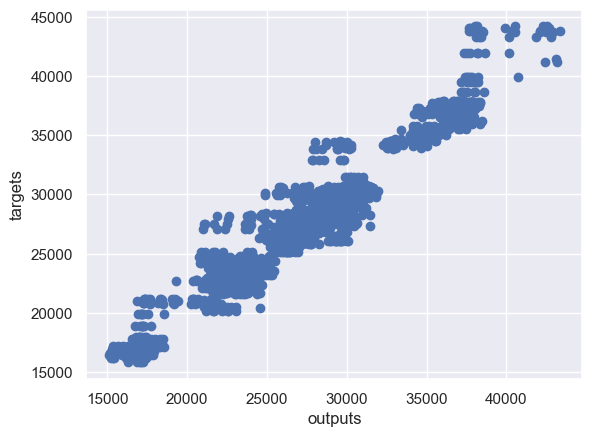

In [80]:
if più_output:
    plt.scatter(np.squeeze(modello_scelto.predict_on_batch(X_test)), np.squeeze(Y_test))
    plt.xlabel('outputs')
    plt.ylabel('targets')
    plt.show()
else:
    plt.scatter(np.squeeze(modello_scelto.predict_on_batch(X_test)), np.squeeze(y_test))
    plt.xlabel('outputs')
    plt.ylabel('targets')
    plt.show()

In [81]:
previsioni_totali_modello_scelto = modello_scelto.predict(X)

121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [82]:
len(previsioni_totali_modello_scelto)

3843

In [83]:
# Conto il numero di colonne in X_train che contiene la parola "passato"
passato = sum('passato' in col for col in X_train.columns)
passato

30

In [84]:
df

,Timestamp,prezzo_presente,prezzo_passato_1,prezzo_passato_2,prezzo_passato_3,prezzo_passato_4,prezzo_passato_5,prezzo_passato_6,prezzo_passato_7,prezzo_passato_8,prezzo_passato_9,prezzo_passato_10,prezzo_passato_11,prezzo_passato_12,prezzo_passato_13,prezzo_passato_14,prezzo_passato_15,prezzo_passato_16,prezzo_passato_17,prezzo_passato_18,prezzo_passato_19,prezzo_passato_20,prezzo_passato_21,prezzo_passato_22,prezzo_passato_23,prezzo_passato_24,prezzo_passato_25,prezzo_passato_26,prezzo_passato_27,prezzo_passato_28,prezzo_passato_29,prezzo_passato_30,prezzo_futuro_1,prezzo_futuro_2,prezzo_futuro_3,prezzo_futuro_4,prezzo_futuro_5,prezzo_futuro_6,prezzo_futuro_7
0,2013-05-28,129.18,128.99,134.60,130.77,131.70,125.75,123.00,122.90,122.58,120.50,123.88,123.10,115.50,114.16,114.50,117.18,114.71,113.01,118.78,113.00,112.64,106.40,118.33,116.79,111.25,91.01,103.43,117.00,135.30,141.96,135.30,132.13,127.40,127.98,129.09,121.30,121.16,121.31
1,2013-05-29,132.13,129.18,128.99,134.60,130.77,131.70,125.75,123.00,122.90,122.58,120.50,123.88,123.10,115.50,114.16,114.50,117.18,114.71,113.01,118.78,113.00,112.64,106.40,118.33,116.79,111.25,91.01,103.43,117.00,135.30,141.96,127.40,127.98,129.09,121.30,121.16,121.31,121.71
2,2013-05-30,127.40,132.13,129.18,128.99,134.60,130.77,131.70,125.75,123.00,122.90,122.58,120.50,123.88,123.10,115.50,114.16,114.50,117.18,114.71,113.01,118.78,113.00,112.64,106.40,118.33,116.79,111.25,91.01,103.43,117.00,135.30,127.98,129.09,121.30,121.16,121.31,121.71,119.00
3,2013-05-31,127.98,127.40,132.13,129.18,128.99,134.60,130.77,131.70,125.75,123.00,122.90,122.58,120.50,123.88,123.10,115.50,114.16,114.50,117.18,114.71,113.01,118.78,113.00,112.64,106.40,118.33,116.79,111.25,91.01,103.43,117.00,129.09,121.30,121.16,121.31,121.71,119.00,110.09
4,2013-06-01,129.09,127.98,127.40,132.13,129.18,128.99,134.60,130.77,131.70,125.75,123.00,122.90,122.58,120.50,123.88,123.10,115.50,114.16,114.50,117.18,114.71,113.01,118.78,113.00,112.64,106.40,118.33,116.79,111.25,91.01,103.43,121.30,121.16,121.31,121.71,119.00,110.09,108.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3838,2023-12-02,"38,688.26","37,711.82","37,810.35","37,802.24","37,250.17","37,491.84","37,809.85","37,738.93","37,293.32","37,464.83","35,965.36","37,489.30","37,413.99","36,582.37","36,527.76","36,201.52","37,903.66","35,545.20","36,549.16","37,067.70","37,122.72","37,344.25","36,768.42","35,795.08","35,436.54","35,031.27","35,061.93","35,048.41","34,731.38","34,924.06","35,457.45","39,481.67","39,960.28","41,974.33","44,105.94","43,788.29","43,270.12","44,202.18"
3839,2023-12-03,"39,481.67","38,688.26","37,711.82","37,810.35","37,802.24","37,250.17","37,491.84","37,809.85","37,738.93","37,293.32","37,464.83","35,965.36","37,489.30","37,413.99","36,582.37","36,527.76","36,201.52","37,903.66","35,545.20","36,549.16","37,067.70","37,122.72","37,344.25","36,768.42","35,795.08","35,436.54","35,031.27","35,061.93","35,048.41","34,731.38","34,924.06","39,960.28","41,974.33","44,105.94","43,788.29","43,270.12","44,202.18","43,745.49"
3840,2023-12-04,"39,960.28","39,481.67","38,688.26","37,711.82","37,810.35","37,802.24","37,250.17","37,491.84","37,809.85","37,738.93","37,293.32","37,464.83","35,965.36","37,489.30","37,413.99","36,582.37","36,527.76","36,201.52","37,903.66","35,545.20","36,549.16","37,067.70","37,122.72","37,344.25","36,768.42","35,795.08","35,436.54","35,031.27","35,061.93","35,048.41","34,731.38","41,974.33","44,105.94","43,788.29","43,270.12","44,202.18","43,745.49","43,757.96"
3841,2023-12-05,"41,974.33","39,960.28","39,481.67","38,688.26","37,711.82","37,810.35","37,802.24","37,250.17","37,491.84","37,809.85","37,738.93","37,293.32","37,464.83","35,965.36","37,489.30","37,413.99","36,582.37","36,527.76","36,201.52","37,903.66","35,545.20","36,549.16","37,067.70","37,122.72","37,344.25","36,768.42","35,795.08","35,436.54","35,031.27",

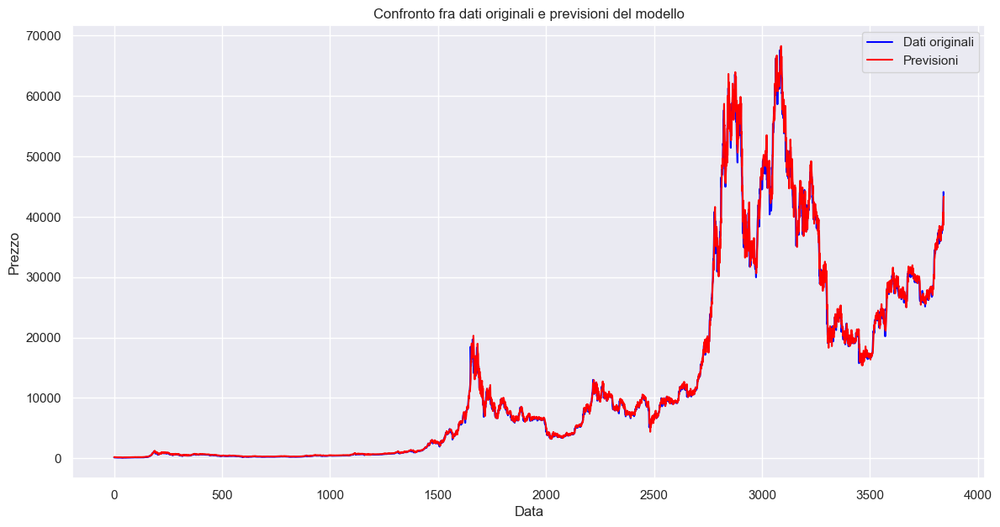

In [85]:
# Creo una colonna 'Previsioni' nel DataFrame originale
df['Previsioni'] = 0  # Inizializzo con valori dummy
df['Previsioni'] = previsioni_totali_modello_scelto

# Grafico dei dati originali e delle previsioni
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['prezzo_futuro_1'], label='Dati originali', color='blue')
plt.plot(df.index, df['Previsioni'], label='Previsioni', color='red')
plt.title('Confronto fra dati originali e previsioni del modello')
plt.xlabel('Data')
plt.ylabel('Prezzo')
plt.legend()
plt.grid(True)
plt.show()

<h6> Performance random forest </h6>

In [87]:
if più_output:
    y_train = Y_train

print('Performance sul training set:')
# Ottengo le probabilità previste
predizioni_train = modello_scelto.predict(X_train)


print('\nMSE:')
mse_train = mean_squared_error(y_train, predizioni_train)
print(mse_train)

print('\nMAPE:')
mape_train = mean_absolute_percentage_error(y_train, predizioni_train)
print(f'{round(mape_train*100, 2)}%')

print('\nMAE:')
mae_train = mean_absolute_error(y_train, predizioni_train)
print(mae_train)

print('\nR^2:')
r2_train = r2_score(y_train, predizioni_train)
print(f'{round(r2_train*100, 2)}%')

prime_3_metriche = [mse_train, mape_train, mae_train]

print('\nMedia aritmetica di MSE, MAPE e MAE:')
media_train = np.mean(prime_3_metriche)
print(media_train)

pesi_media_pesata = {
    'MSE': 1,
    'MAPE': 5,
    'MAE': 1
}

print('\nMedia pesata di MSE, MAPE e MAE:')
media_pesata_train = sum(x * w for x, w in zip(prime_3_metriche, pesi_media_pesata.values())) / sum(pesi_media_pesata.values())
print(media_pesata_train)

Performance sul training set:
 1/97 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step

97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

MSE:
2131642.116457765

MAPE:
12.07%

MAE:
594.3072741080974

R^2:
98.85%

Media aritmetica di MSE, MAPE e MAE:
710745.5148256129

Media pesata di MSE, MAPE e MAE:
304605.2896366716


In [88]:
if più_output:
    y_val = Y_val

print('Performance sul validation set:')
# Ottengo le probabilità previste
predizioni_val = modello_scelto.predict(X_val)


print('\nMSE:')
mse_val = mean_squared_error(y_val, predizioni_val)
print(mse_val)

print('\nMAPE:')
mape_val = mean_absolute_percentage_error(y_val, predizioni_val)
print(f'{round(mape_val*100, 2)}%')

print('\nMAE:')
mae_val = mean_absolute_error(y_val, predizioni_val)
print(mae_val)

print('\nR^2:')
r2_val = r2_score(y_val, predizioni_val)
print(f'{round(r2_val*100, 2)}%')

prime_3_metriche = [mse_val, mape_val, mae_val]

print('\nMedia aritmetica di MSE, MAPE e MAE:')
media_val = np.mean(prime_3_metriche)
print(media_val)

pesi_media_pesata = {
    'MSE': 1,
    'MAPE': 5,
    'MAE': 1
}

print('\nMedia pesata di MSE, MAPE e MAE:')
media_pesata_val = sum(x * w for x, w in zip(prime_3_metriche, pesi_media_pesata.values())) / sum(pesi_media_pesata.values())
print(media_pesata_val)

Performance sul validation set:
 1/12 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

MSE:
7191894.6128639905

MAPE:
5.86%

MAE:
1909.7206963419035

R^2:
95.87%

Media aritmetica di MSE, MAPE e MAE:
2397934.7973741614

Media pesata di MSE, MAPE e MAE:
1027686.3751958698


In [89]:
if più_output:
    y_test = Y_test

print('Performance sul test set:')
# Ottengo le probabilità previste
predizioni_test = modello_scelto.predict(X_test)


print('\nMSE:')
mse_test = mean_squared_error(y_test, predizioni_test)
print(mse_test)

print('\nMAPE:')
mape_test = mean_absolute_percentage_error(y_test, predizioni_test)
print(f'{round(mape_test*100, 2)}%')

print('\nMAE:')
mae_test = mean_absolute_error(y_test, predizioni_test)
print(mae_test)

print('\nR^2:')
r2_test = r2_score(y_test, predizioni_test)
print(f'{round(r2_test*100, 2)}%')

prime_3_metriche = [mse_test, mape_test, mae_test]

print('\nMedia aritmetica di MSE, MAPE e MAE:')
media_test = np.mean(prime_3_metriche)
print(media_test)

pesi_media_pesata = {
    'MSE': 1,
    'MAPE': 5,
    'MAE': 1
}

print('\nMedia pesata di MSE, MAPE e MAE:')
media_pesata_test = sum(x * w for x, w in zip(prime_3_metriche, pesi_media_pesata.values())) / sum(pesi_media_pesata.values())
print(media_pesata_test)

Performance sul test set:
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

MSE:
2087488.6381577945

MAPE:
3.69%

MAE:
987.5135788225436

R^2:
93.78%

Media aritmetica di MSE, MAPE e MAE:
696158.7295563215

Media pesata di MSE, MAPE e MAE:
298353.76234262215


### Visualizzazione in Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir "logs/fit"

### Regressione polinomiale (lineare)

In [6]:
import pandas as pd
df_senza_valori_nan_nuovo = pd.read_csv("Dataset Bitcoin+ esteso da me (passato_1500, futuro_30, periodo originale dal 28-4-2013 al 4-3-2024).csv")

In [7]:
df_senza_valori_nan_nuovo

,prezzo_presente,prezzo_passato_1,prezzo_passato_2,prezzo_passato_3,prezzo_passato_4,prezzo_passato_5,prezzo_passato_6,prezzo_passato_7,prezzo_passato_8,prezzo_passato_9,...,prezzo_futuro_24,prezzo_futuro_25,prezzo_futuro_26,prezzo_futuro_27,prezzo_futuro_28,prezzo_futuro_29,prezzo_futuro_30,Giorno,Mese,Anno
0,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,2072.354900,1939.995600,...,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,8,6,2017
1,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,2072.354900,...,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,9,6,2017
2,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,...,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,10,6,2017
3,2689.051900,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,...,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,2052.287611,11,6,2017
4,2413.900500,2689.051900,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,...,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,2052.287611,2091.209408,12,6,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2427,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,38141.445735,38173.221525,...,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,30,1,2024
2428,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,38141.445735,...,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,31,1,2024
2429,39390.455612,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,...,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,57560.483900,1,2,2024
2430,39601.985426,39390.455612,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,...,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,57560.483900,57229.676585,2,2,2024


In [8]:
df_senza_valori_nan_nuovo.drop(['Giorno','Mese', 'Anno'], axis=1, inplace=True)
df_senza_valori_nan_nuovo

,prezzo_presente,prezzo_passato_1,prezzo_passato_2,prezzo_passato_3,prezzo_passato_4,prezzo_passato_5,prezzo_passato_6,prezzo_passato_7,prezzo_passato_8,prezzo_passato_9,...,prezzo_futuro_21,prezzo_futuro_22,prezzo_futuro_23,prezzo_futuro_24,prezzo_futuro_25,prezzo_futuro_26,prezzo_futuro_27,prezzo_futuro_28,prezzo_futuro_29,prezzo_futuro_30
0,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,2072.354900,1939.995600,...,2238.963369,2179.708192,2135.587135,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528
1,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,2072.354900,...,2179.708192,2135.587135,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631
2,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,...,2135.587135,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925
3,2689.051900,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,...,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,2052.287611
4,2413.900500,2689.051900,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,...,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,2052.287611,2091.209408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2427,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,38141.445735,38173.221525,...,48043.597882,48367.898536,47916.290054,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389
2428,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,38141.445735,...,48367.898536,47916.290054,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616
2429,39390.455612,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,...,47916.290054,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,57560.483900
2430,39601.985426,39390.455612,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,...,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,57560.483900,57229.676585


In [11]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Carica il tuo dataset (assumendo che sia un DataFrame pandas)
# Assicurati di avere importato tutte le librerie necessarie

# Supponiamo che 'dataset' sia il tuo DataFrame
features = df_senza_valori_nan_nuovo.iloc[:, :-30]  # Seleziona tutte le colonne tranne le ultime sette (e Timestamp)
targets = df_senza_valori_nan_nuovo.iloc[:, -30:]    # Seleziona solo le ultime sette colonne

# Divido il dataset in set di addestramento e test in modo casuale
# X_train, X_test, y_train, y_test = train_test_split(features, targets, test_size=0.2, random_state=42)

# Divido il dataset in set di addestramento e test in modo continuo
train_size = int(0.8 * len(features))
X_train, y_train = features[:train_size], targets[:train_size]
X_test, y_test = features[train_size:], targets[train_size:]

# Applica la regressione polinomiale a ciascun target
# degree = 1  # Puoi regolare il grado del polinomio
# poly = PolynomialFeatures(degree=degree)

# Addestra un modello separato per ciascun target
models = []
for i in range(targets.shape[1]):
    y_train_target = y_train.iloc[:, i]
    # X_train_poly = poly.fit_transform(X_train)
    model = LinearRegression()
    model.fit(X_train, y_train_target)
    models.append(model)

# Valuta le prestazioni di ciascun modello
y_preds = []
lista_mse = []
lista_mae = []
lista_mape = []
for i, model in enumerate(models):
    # X_test_poly = poly.transform(X_test)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test.iloc[:, i], y_pred)
    lista_mse.append(mse)
    mae = mean_absolute_error(y_test.iloc[:, i], y_pred)
    lista_mae.append(mae)
    mape = mean_absolute_percentage_error(y_test.iloc[:, i], y_pred)
    lista_mape.append(mape)
    print(f'MSE for Target {i+1}: {mse}')
    print(f'MAE for Target {i+1}: {mae}')
    print(f'MAPE for Target {i+1}: {mape}\n')
    y_preds.append(y_pred)

print(f'MSE medio per tutti i target: {np.mean(lista_mse)}')
print(f'MAE medio per tutti i target: {np.mean(lista_mae)}')
print(f'MAPE medio per tutti i target: {np.mean(lista_mape)}')

# Nota: y_preds contiene le previsioni per ciascun target

MSE for Target 1: 29603505.433227498
MAE for Target 1: 4375.454900512972
MAPE for Target 1: 0.17623506093992813

MSE for Target 2: 76740340.3856403
MAE for Target 2: 7153.445069459927
MAPE for Target 2: 0.29042403054078564

MSE for Target 3: 140469765.54466715
MAE for Target 3: 9735.809141993755
MAPE for Target 3: 0.39572964093062907

MSE for Target 4: 210729723.25074112
MAE for Target 4: 11950.217004340346
MAPE for Target 4: 0.48621649164167113

MSE for Target 5: 277432147.47938526
MAE for Target 5: 13669.846046614091
MAPE for Target 5: 0.5558672687430616

MSE for Target 6: 327138929.93382674
MAE for Target 6: 14801.983757990174
MAPE for Target 6: 0.6007046640244412

MSE for Target 7: 359559668.6534863
MAE for Target 7: 15420.233846478493
MAPE for Target 7: 0.6241857047854498

MSE for Target 8: 373661873.366267
MAE for Target 8: 15476.484029680683
MAPE for Target 8: 0.6239312909124426

MSE for Target 9: 365404734.9980805
MAE for Target 9: 15074.791020714303
MAPE for Target 9: 0.603643

In [130]:
models[0].coef_

array([ 0.9621493 ,  0.06895919,  0.01257839, -0.01652664,  0.02352628,
       -0.04730702, -0.05866118,  0.00804209,  0.11088197,  0.02773979,
       -0.08790092, -0.08077203,  0.12594587, -0.05117165, -0.05843625,
        0.02193374,  0.06979628, -0.04336186, -0.01826013,  0.11136025,
       -0.12713117,  0.03006561, -0.05598053,  0.11516364, -0.04281105,
        0.05211375,  0.00798732,  0.00869331, -0.12605735,  0.0639731 ,
       -0.00564143])

In [131]:
import joblib

# Salva il modello utilizzando joblib
joblib.dump(models, 'modello.h5')

['modello.h5']

### Regressione polinomiale (generica)

In [12]:
import pandas as pd
df_senza_valori_nan_nuovo = pd.read_csv("Dataset Bitcoin+ esteso da me (passato_1500, futuro_30, periodo originale dal 28-4-2013 al 4-3-2024).csv")

In [13]:
df_senza_valori_nan_nuovo

,prezzo_presente,prezzo_passato_1,prezzo_passato_2,prezzo_passato_3,prezzo_passato_4,prezzo_passato_5,prezzo_passato_6,prezzo_passato_7,prezzo_passato_8,prezzo_passato_9,...,prezzo_futuro_24,prezzo_futuro_25,prezzo_futuro_26,prezzo_futuro_27,prezzo_futuro_28,prezzo_futuro_29,prezzo_futuro_30,Giorno,Mese,Anno
0,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,2072.354900,1939.995600,...,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,8,6,2017
1,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,2072.354900,...,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,9,6,2017
2,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,...,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,10,6,2017
3,2689.051900,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,...,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,2052.287611,11,6,2017
4,2413.900500,2689.051900,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,...,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,2052.287611,2091.209408,12,6,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2427,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,38141.445735,38173.221525,...,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,30,1,2024
2428,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,38141.445735,...,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,31,1,2024
2429,39390.455612,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,...,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,57560.483900,1,2,2024
2430,39601.985426,39390.455612,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,...,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,57560.483900,57229.676585,2,2,2024


In [14]:
df_senza_valori_nan_nuovo.drop(['Giorno','Mese', 'Anno'], axis=1, inplace=True)
df_senza_valori_nan_nuovo

,prezzo_presente,prezzo_passato_1,prezzo_passato_2,prezzo_passato_3,prezzo_passato_4,prezzo_passato_5,prezzo_passato_6,prezzo_passato_7,prezzo_passato_8,prezzo_passato_9,...,prezzo_futuro_21,prezzo_futuro_22,prezzo_futuro_23,prezzo_futuro_24,prezzo_futuro_25,prezzo_futuro_26,prezzo_futuro_27,prezzo_futuro_28,prezzo_futuro_29,prezzo_futuro_30
0,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,2072.354900,1939.995600,...,2238.963369,2179.708192,2135.587135,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528
1,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,2072.354900,...,2179.708192,2135.587135,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631
2,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,2173.665100,...,2135.587135,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925
3,2689.051900,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,2228.136100,...,2204.251340,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,2052.287611
4,2413.900500,2689.051900,2623.630900,2517.886400,2520.805200,2412.539200,2573.405500,2418.635100,2266.554700,2271.276500,...,2266.818339,2299.748387,2296.449190,2287.340707,2200.484001,2248.614528,2209.809631,2073.873925,2052.287611,2091.209408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2427,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,38141.445735,38173.221525,...,48043.597882,48367.898536,47916.290054,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389
2428,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,38141.445735,...,48367.898536,47916.290054,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616
2429,39390.455612,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,36313.419449,...,47916.290054,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,57560.483900
2430,39601.985426,39390.455612,39555.506056,39930.075700,38759.180185,38771.396298,38535.125270,36811.158551,36871.206159,36689.359739,...,47410.493801,46933.944013,47591.241230,47833.386650,50208.135988,52573.782675,57717.736389,56734.564616,57560.483900,57229.676585


In [16]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Carica il tuo dataset (assumendo che sia un DataFrame pandas)
# Assicurati di avere importato tutte le librerie necessarie

# Supponiamo che 'dataset' sia il tuo DataFrame
features = df_senza_valori_nan_nuovo.iloc[:, :-30]  # Seleziona tutte le colonne tranne le ultime sette (e Timestamp)
targets = df_senza_valori_nan_nuovo.iloc[:, -30:]    # Seleziona solo le ultime sette colonne

# Divido il dataset in set di addestramento e test in modo casuale
# X_train, X_test, y_train, y_test = train_test_split(features, targets, test_size=0.2, random_state=42)

# Divido il dataset in set di addestramento e test in modo continuo
train_size = int(0.8 * len(features))
X_train, y_train = features[:train_size], targets[:train_size]
X_test, y_test = features[train_size:], targets[train_size:]

# Applica la regressione polinomiale a ciascun target
degree = 1  # Puoi regolare il grado del polinomio
poly = PolynomialFeatures(degree=degree)

# Addestra un modello separato per ciascun target
models = []
for i in range(targets.shape[1]):
    y_train_target = y_train.iloc[:, i]
    X_train_poly = poly.fit_transform(X_train)
    model = LinearRegression()
    model.fit(X_train_poly, y_train_target)
    models.append(model)

# Valuta le prestazioni di ciascun modello
y_preds = []
lista_mse = []
lista_mae = []
lista_mape = []
for i, model in enumerate(models):
    X_test_poly = poly.transform(X_test)
    y_pred = model.predict(X_test_poly)
    mse = mean_squared_error(y_test.iloc[:, i], y_pred)
    lista_mse.append(mse)
    mae = mean_absolute_error(y_test.iloc[:, i], y_pred)
    lista_mae.append(mae)
    mape = mean_absolute_percentage_error(y_test.iloc[:, i], y_pred)
    lista_mape.append(mape)
    print(f'MSE for Target {i+1}: {mse}')
    print(f'MAE for Target {i+1}: {mae}')
    print(f'MAPE for Target {i+1}: {mape}\n')
    y_preds.append(y_pred)

print(f'MSE medio per tutti i target: {np.mean(lista_mse)}')
print(f'MAE medio per tutti i target: {np.mean(lista_mae)}')
print(f'MAPE medio per tutti i target: {np.mean(lista_mape)}')

# Nota: y_preds contiene le previsioni per ciascun target

MSE for Target 1: 29603505.433226913
MAE for Target 1: 4375.454900512893
MAPE for Target 1: 0.17623506093992433

MSE for Target 2: 76740340.38564384
MAE for Target 2: 7153.44506946007
MAPE for Target 2: 0.2904240305407932

MSE for Target 3: 140469765.54466248
MAE for Target 3: 9735.809141993725
MAPE for Target 3: 0.39572964093063046

MSE for Target 4: 210729723.25073248
MAE for Target 4: 11950.217004340226
MAPE for Target 4: 0.48621649164166897

MSE for Target 5: 277432147.4793767
MAE for Target 5: 13669.846046614111
MAPE for Target 5: 0.5558672687430662

MSE for Target 6: 327138929.93380934
MAE for Target 6: 14801.983757989823
MAPE for Target 6: 0.6007046640244312

MSE for Target 7: 359559668.65345746
MAE for Target 7: 15420.233846477777
MAPE for Target 7: 0.624185704785429

MSE for Target 8: 373661873.36625904
MAE for Target 8: 15476.48402968082
MAPE for Target 8: 0.6239312909124526

MSE for Target 9: 365404734.9980712
MAE for Target 9: 15074.791020714416
MAPE for Target 9: 0.6036432

In [19]:
models[0].coef_

array([ 1.41958513e-12,  1.00323798e+00, -2.41475906e-02, ...,
       -4.47095130e-01, -2.91271611e-01,  2.70494843e-01])

In [9]:
import joblib

# Salva il modello utilizzando joblib
joblib.dump(models, 'modello 1500.h5')

['modello 1500.h5']

### Creo un nuovo dataframe con nuove colonne

In [145]:
# Concateno i DataFrame X_train, X_val e X_test verticalmente
X_concatenato = pd.concat([X_train, X_val, X_test], axis=0)

# Concateno le etichette target y_train, y_val e y_test verticalmente
y_concatenato = pd.concat([y_train, y_val, y_test], axis=0)

# Creo una colonna 'Origine' con i flag che indicano l'origine dei dati
origine_train = ['Train'] * len(X_train)
origine_val = ['Test_1'] * len(X_val)
origine_test = ['Test out-of-sample'] * len(X_test)

origine = origine_train + origine_val + origine_test

# Creo un nuovo DataFrame con tutte le colonne desiderate
df_completo = pd.DataFrame(data=X_concatenato)
df_completo['Target_95'] = y_concatenato
df_completo['Origine'] = origine

df_completo

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Origine
36698,52.0000,1.5208,2.2500,0.0434,5000.0000,12.0000,276.2500,0.0000,4.0000,999.0000,1126.0000,0.7708,1407.7700,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Train
90092,50.0000,0.6181,1.1667,0.0000,19586.0000,12.0000,263.2400,1.0000,3.0833,14.0000,456.0000,0.4054,17528.0300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,Train
156,24.0000,1.3452,1.5714,0.2015,1500.0000,6.0000,90.0600,1.0000,2.0000,16.0000,183.0000,0.2500,1218.7400,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,Train
37624,52.0000,0.7014,1.1667,0.0387,16439.9000,12.0000,310.2200,0.0000,7.0000,28.0000,2434.0000,0.9524,1266.7900,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,Train
69227,41.0000,0.5417,1.0000,0.0000,14224.0000,12.0000,252.0700,1.0000,8.0000,15.0000,1743.0000,0.5938,7217.5800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84799,42.0000,0.4931,0.9167,0.0000,2528.7500,5.0000,49.2700,1.0000,3.0000,15.0000,668.0000,0.6111,1032.6700,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,1,Test out-of-sample
23810,57.0000,0.5667,0.8000,0.4366,2000.0000,8.0000,299.7500,2.0000,1.0000,29.0000,272.0000,0.7500,668.1400,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,Test out-of-sample
23132,30.0000,0.7083,1.2500,0.0493,2450.0000,12.0000,243.5100,2.0000,2.0000,31.0000,670.0000,0.9167,337.7800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,Test out-of-sample
83040,60.0000,0.5417,1.0000,0.0965,5577.0000,12.0000,124.3800,1.0000,6.0000,17.0000,1673.0000,0.7639,1732.0900,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,Test out-of-sample


In [146]:
ordine_colonne = dummies.columns
ordine_colonne

Index(['Target_95', 'Eta_Debitore', 'Severity_12M_pesata', 'Severity_12M',
       'RATIO_ONERI_AFF_TOT_AFF', 'IMP_FINANZIATO', 'Numero_mesi_rec',
       'TOT_AFF', 'DistanzaAffidoUltimoPagamento', 'DurataFinanziamentoAnni',
       'AgeingGestioneGg', 'AgeingErogazioneGg', 'Ratio_Rate_Imp1',
       'Cash Balance', 'Nazionalita_Italiano', 'Nazionalita_Non Valutabile',
       'Sesso_Non Valutabile', 'Sesso_Uomo',
       'Denominazione Regione_Basilicata', 'Denominazione Regione_Calabria',
       'Denominazione Regione_Campania',
       'Denominazione Regione_Emilia-Romagna',
       'Denominazione Regione_Friuli-Venezia Giulia',
       'Denominazione Regione_Lazio', 'Denominazione Regione_Liguria',
       'Denominazione Regione_Lombardia', 'Denominazione Regione_Marche',
       'Denominazione Regione_Molise', 'Denominazione Regione_Non Valutabile',
       'Denominazione Regione_Piemonte', 'Denominazione Regione_Puglia',
       'Denominazione Regione_Sardegna', 'Denominazione Regione_Sicili

In [147]:
# Calcolo le probabilità continue utilizzando il mio modello_scelto
features = ordine_colonne.drop('Target_95')

probabilità_continue = modello_scelto.predict_proba(df_completo[features])

# Estraggo le probabilità relative alla classe 1
probabilità_classe_1 = probabilità_continue[:, 1]

# Aggiungo una nuova colonna al DataFrame df_completo con le probabilità continue
df_completo['Probabilità_Target_95_predicted'] = probabilità_classe_1

df_completo

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Origine,Probabilità_Target_95_predicted
36698,52.0000,1.5208,2.2500,0.0434,5000.0000,12.0000,276.2500,0.0000,4.0000,999.0000,1126.0000,0.7708,1407.7700,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Train,0.0101
90092,50.0000,0.6181,1.1667,0.0000,19586.0000,12.0000,263.2400,1.0000,3.0833,14.0000,456.0000,0.4054,17528.0300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,Train,0.8600
156,24.0000,1.3452,1.5714,0.2015,1500.0000,6.0000,90.0600,1.0000,2.0000,16.0000,183.0000,0.2500,1218.7400,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,Train,0.1000
37624,52.0000,0.7014,1.1667,0.0387,16439.9000,12.0000,310.2200,0.0000,7.0000,28.0000,2434.0000,0.9524,1266.7900,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,Train,0.0918
69227,41.0000,0.5417,1.0000,0.0000,14224.0000,12.0000,252.0700,1.0000,8.0000,15.0000,1743.0000,0.5938,7217.5800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.7969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84799,42.0000,0.4931,0.9167,0.0000,2528.7500,5.0000,49.2700,1.0000,3.0000,15.0000,668.0000,0.6111,1032.6700,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,1,Test out-of-sample,0.7327
23810,57.0000,0.5667,0.8000,0.4366,2000.0000,8.0000,299.7500,2.0000,1.0000,29.0000,272.0000,0.7500,668.1400,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,Test out-of-sample,0.0350
23132,30.0000,0.7083,1.2500,0.0493,2450.0000,12.0000,243.5100,2.0000,2.0000,31.0000,670.0000,0.9167,337.7800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,Test out-of-sample,0.3310
83040,60.0000,0.5417,1.0000,0.0965,5577.0000,12.0000,124.3800,1.0000,6.0000,17.0000,1673.0000,0.7639,1732.0900,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,Test out-of-sample,0.1593


In [148]:
df_completo.index

Int64Index([ 36698,  90092,    156,  37624,  69227, 102293,  63860,  72023,
             90078,  78772,
            ...
              4750,  73475,  66619,  74954,  66272,  84799,  23810,  23132,
             83040,  41883],
           dtype='int64', length=113621)

In [149]:
# Controllo se in df_clienti c'erano certe colonne
lista_check = ['CODICE_PHONIA', 'TOT REC', 'PRATICA', 'Chiave', 'TOT AFF']

sono_presenti_tutti = all(colonna in df_clienti.columns for colonna in lista_check)
sono_presenti_tutti

True

In [150]:
sorted(df_clienti.columns)

['AgeingErogazioneGg',
 'AgeingGestioneGg',
 'CODICE_PHONIA',
 'COD_FISC_INT',
 'CURRENT_BALANCE',
 'Cash Balance',
 'Chiave',
 'Codi_FISC_INT_2',
 'DATA AFFIDO',
 'DATA FINE LAV',
 'DATA_AFFIDO',
 'DATA_AGGIORNAMENTO',
 'DATA_ESTINZ',
 'DATA_FINANZIAM',
 'DATA_FINE_AFFIDO',
 'DELIN_HISTORY',
 'DES_BENE',
 'DES_PRODOTTO',
 'DT_VAL_RAT_IMP1',
 'DT_VAL_RAT_IMP2',
 'DT_VAL_ULT_PAGAM',
 'Denominazione Regione',
 'DistanzaAffidoUltimoPagamento',
 'DurataFinanziamentoAnni',
 'Eta_Debitore',
 'FlagRecOver100',
 'Flag_Cointestazione',
 'Flag_Galleggiamento_3M',
 'Flag_Galleggiamento_6M',
 'Flag_Garante',
 'Flag_Gestione_Prec',
 'Flag_InsolvenzaGrave_12M',
 'Flag_InsolvenzaGrave_3M',
 'Flag_InsolvenzaGrave_6M',
 'Flag_Miglioramento_3M',
 'Flag_Rate_piu_uno',
 'Flag_Riciclo_SDD',
 'Flag_Rifinanziamento',
 'Flag_Scivolamento_3M',
 'Flag_Scivolamento_6M',
 'Flag_rientrototale_6M',
 'IMP_FINANZIATO',
 'IMP_MAXIRATA',
 'IMP_PAG_RAT_IMP1',
 'IMP_PAG_RAT_IMP2',
 'IMP_RAT_IMP1',
 'IMP_RAT_IMP2',
 'MACR

In [151]:
df_completo

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Origine,Probabilità_Target_95_predicted
36698,52.0000,1.5208,2.2500,0.0434,5000.0000,12.0000,276.2500,0.0000,4.0000,999.0000,1126.0000,0.7708,1407.7700,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Train,0.0101
90092,50.0000,0.6181,1.1667,0.0000,19586.0000,12.0000,263.2400,1.0000,3.0833,14.0000,456.0000,0.4054,17528.0300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,Train,0.8600
156,24.0000,1.3452,1.5714,0.2015,1500.0000,6.0000,90.0600,1.0000,2.0000,16.0000,183.0000,0.2500,1218.7400,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,Train,0.1000
37624,52.0000,0.7014,1.1667,0.0387,16439.9000,12.0000,310.2200,0.0000,7.0000,28.0000,2434.0000,0.9524,1266.7900,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,Train,0.0918
69227,41.0000,0.5417,1.0000,0.0000,14224.0000,12.0000,252.0700,1.0000,8.0000,15.0000,1743.0000,0.5938,7217.5800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.7969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84799,42.0000,0.4931,0.9167,0.0000,2528.7500,5.0000,49.2700,1.0000,3.0000,15.0000,668.0000,0.6111,1032.6700,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,1,Test out-of-sample,0.7327
23810,57.0000,0.5667,0.8000,0.4366,2000.0000,8.0000,299.7500,2.0000,1.0000,29.0000,272.0000,0.7500,668.1400,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,Test out-of-sample,0.0350
23132,30.0000,0.7083,1.2500,0.0493,2450.0000,12.0000,243.5100,2.0000,2.0000,31.0000,670.0000,0.9167,337.7800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,Test out-of-sample,0.3310
83040,60.0000,0.5417,1.0000,0.0965,5577.0000,12.0000,124.3800,1.0000,6.0000,17.0000,1673.0000,0.7639,1732.0900,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,Test out-of-sample,0.1593


In [152]:
# df_completo = df_completo.merge(df_clienti[lista_check], left_on=lista_colonne, right_on=lista_colonne, how='left')

In [153]:
# Faccio una left join per agganciarmi le colonne di lista_check
df_completo = df_completo.merge(df_clienti[lista_check], left_index=True, right_index=True, how='left')

In [154]:
df_completo

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Origine,Probabilità_Target_95_predicted,CODICE_PHONIA,TOT REC,PRATICA,Chiave,TOT AFF
36698,52.0000,1.5208,2.2500,0.0434,5000.0000,12.0000,276.2500,0.0000,4.0000,999.0000,1126.0000,0.7708,1407.7700,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Train,0.0101,ALPTEL,0.0000,00001529616301,00001529616301_10_2022,258.0000
90092,50.0000,0.6181,1.1667,0.0000,19586.0000,12.0000,263.2400,1.0000,3.0833,14.0000,456.0000,0.4054,17528.0300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,Train,0.8600,AQPTEL,293.8500,00002365625301,00002365625301_08_2022,293.8500
156,24.0000,1.3452,1.5714,0.2015,1500.0000,6.0000,90.0600,1.0000,2.0000,16.0000,183.0000,0.2500,1218.7400,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,Train,0.1000,AHPTEL,0.0000,00002273002301,00002273002301_09_2021,89.1500
37624,52.0000,0.7014,1.1667,0.0387,16439.9000,12.0000,310.2200,0.0000,7.0000,28.0000,2434.0000,0.9524,1266.7900,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,Train,0.0918,ALPTEL,259.1500,00005924519200,00005924519200_11_2022,530.3000
69227,41.0000,0.5417,1.0000,0.0000,14224.0000,12.0000,252.0700,1.0000,8.0000,15.0000,1743.0000,0.5938,7217.5800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.7969,ALPTEX,415.3000,00000863025301,00000863025301_04_2023,427.3000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84799,42.0000,0.4931,0.9167,0.0000,2528.7500,5.0000,49.2700,1.0000,3.0000,15.0000,668.0000,0.6111,1032.6700,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,1,Test out-of-sample,0.7327,AQPTEL,73.2400,00001990587301,00001990587301_05_2022,73.2400
23810,57.0000,0.5667,0.8000,0.4366,2000.0000,8.0000,299.7500,2.0000,1.0000,29.0000,272.0000,0.7500,668.1400,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,Test out-of-sample,0.0350,ALPTEL,336.3400,00002269045301,00002269045301_11_2021,467.2200
23132,30.0000,0.7083,1.2500,0.0493,2450.0000,12.0000,243.5100,2.0000,2.0000,31.0000,670.0000,0.9167,337.7800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,

In [155]:
df_completo['Target_95_predicted'] = round(df_completo['Probabilità_Target_95_predicted'])

In [156]:
# df_completo.rename(columns={'Target_95_continuo': 'Probabilità_Target_95_predicted'}, inplace=True)

In [157]:
df_completo

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Origine,Probabilità_Target_95_predicted,CODICE_PHONIA,TOT REC,PRATICA,Chiave,TOT AFF,Target_95_predicted
36698,52.0000,1.5208,2.2500,0.0434,5000.0000,12.0000,276.2500,0.0000,4.0000,999.0000,1126.0000,0.7708,1407.7700,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Train,0.0101,ALPTEL,0.0000,00001529616301,00001529616301_10_2022,258.0000,0.0000
90092,50.0000,0.6181,1.1667,0.0000,19586.0000,12.0000,263.2400,1.0000,3.0833,14.0000,456.0000,0.4054,17528.0300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,Train,0.8600,AQPTEL,293.8500,00002365625301,00002365625301_08_2022,293.8500,1.0000
156,24.0000,1.3452,1.5714,0.2015,1500.0000,6.0000,90.0600,1.0000,2.0000,16.0000,183.0000,0.2500,1218.7400,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,Train,0.1000,AHPTEL,0.0000,00002273002301,00002273002301_09_2021,89.1500,0.0000
37624,52.0000,0.7014,1.1667,0.0387,16439.9000,12.0000,310.2200,0.0000,7.0000,28.0000,2434.0000,0.9524,1266.7900,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,Train,0.0918,ALPTEL,259.1500,00005924519200,00005924519200_11_2022,530.3000,0.0000
69227,41.0000,0.5417,1.0000,0.0000,14224.0000,12.0000,252.0700,1.0000,8.0000,15.0000,1743.0000,0.5938,7217.5800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.7969,ALPTEX,415.3000,00000863025301,00000863025301_04_2023,427.3000,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84799,42.0000,0.4931,0.9167,0.0000,2528.7500,5.0000,49.2700,1.0000,3.0000,15.0000,668.0000,0.6111,1032.6700,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,1,Test out-of-sample,0.7327,AQPTEL,73.2400,00001990587301,00001990587301_05_2022,73.2400,1.0000
23810,57.0000,0.5667,0.8000,0.4366,2000.0000,8.0000,299.7500,2.0000,1.0000,29.0000,272.0000,0.7500,668.1400,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,Test out-of-sample,0.0350,ALPTEL,336.3400,00002269045301,00002269045301_11_2021,467.2200,0.0000
23132,30.0000,0.7083,1.2500,0.0493,2450.0000,12.0000,243.5100,2.0000,2.0000,31.0

<h6> Concateno i dati sintetici </h6>

In [158]:
X_sintetici = X_res[len(X_train):]

In [159]:
X_sintetici.shape

(20668, 55)

In [160]:
y_sintetici = y_res[len(y_train):]

In [161]:
y_sintetici.shape

(20668,)

In [162]:
set(df_completo.columns) - set(X_sintetici.columns)

{'CODICE_PHONIA',
 'Chiave',
 'Origine',
 'PRATICA',
 'Probabilità_Target_95_predicted',
 'TOT AFF',
 'TOT REC',
 'Target_95',
 'Target_95_predicted'}

In [163]:
set(X_sintetici.columns) - set(df_completo.columns)

set()

In [164]:
df_sintetici = pd.concat([X_sintetici, y_sintetici], axis=1)

In [165]:
df_sintetici

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95
92032,46.9806,0.1563,0.2885,0.5846,14326.3909,3.4618,66.1899,0.2885,10.0000,17.7115,1460.1593,0.3929,9939.4399,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
92033,46.7984,0.4731,0.8061,0.0000,1329.0872,6.9278,49.7829,5.6540,2.5000,15.0000,364.4183,0.4000,866.9003,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1
92034,52.5375,0.4815,0.7873,0.0000,2663.6558,7.2903,106.0876,1.3011,2.3495,15.6021,367.6024,0.4283,1674.8231,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
92035,49.9968,0.1738,0.2504,0.0000,6060.9129,1.0022,147.0398,4.9978,4.0000,15.9995,1003.0000,0.6875,2203.7816,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1
92036,42.1884,0.1377,0.1377,0.0000,7285.5071,1.0000,131.7592,2.0000,5.8068,16.0000,191.9856,0.0909,6872.1661,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112695,50.0000,0.5375,0.9944,0.0481,15341.0034,11.3948,249.4304,1.0000,7.0000,15.0672,1525.1694,0.5968,7222.3175,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
112696,50.6360,0.2412,0.2412,0.0000,7107.5050,1.0000,174.5472,2.0000,4.1060,16.0000,124.0741,0.0833,6772.3924,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1
112697,48.8778,0.6160,0.6852,0.2842,3021.7196,3.4344,214.9577,1.0000,1.7828,5.5656,198.8370,0.3098,2255.9582,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1
112698,49.2543,0.5310,0.9197,0.0180,32397.7088,9.8179,679.5678,1.2182,9.3454,27.9450,1652.1845,0.4844,19489.1380,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [166]:
# Calcolo le probabilità continue utilizzando il mio modello_scelto
features = ordine_colonne.drop('Target_95')

probabilità_continue_sin = modello_scelto.predict_proba(df_sintetici[features])

# Estraggo le probabilità relative alla classe 1
probabilità_classe_1_sin = probabilità_continue_sin[:, 1]

# Aggiungo una nuova colonna al DataFrame df_completo con le probabilità continue
df_sintetici['Probabilità_Target_95_predicted'] = probabilità_classe_1_sin

df_sintetici

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Probabilità_Target_95_predicted
92032,46.9806,0.1563,0.2885,0.5846,14326.3909,3.4618,66.1899,0.2885,10.0000,17.7115,1460.1593,0.3929,9939.4399,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0.9500
92033,46.7984,0.4731,0.8061,0.0000,1329.0872,6.9278,49.7829,5.6540,2.5000,15.0000,364.4183,0.4000,866.9003,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1,0.9550
92034,52.5375,0.4815,0.7873,0.0000,2663.6558,7.2903,106.0876,1.3011,2.3495,15.6021,367.6024,0.4283,1674.8231,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1.0000
92035,49.9968,0.1738,0.2504,0.0000,6060.9129,1.0022,147.0398,4.9978,4.0000,15.9995,1003.0000,0.6875,2203.7816,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0.9935
92036,42.1884,0.1377,0.1377,0.0000,7285.5071,1.0000,131.7592,2.0000,5.8068,16.0000,191.9856,0.0909,6872.1661,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0.9567
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112695,50.0000,0.5375,0.9944,0.0481,15341.0034,11.3948,249.4304,1.0000,7.0000,15.0672,1525.1694,0.5968,7222.3175,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0.9267
112696,50.6360,0.2412,0.2412,0.0000,7107.5050,1.0000,174.5472,2.0000,4.1060,16.0000,124.0741,0.0833,6772.3924,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0.9620
112697,48.8778,0.6160,0.6852,0.2842,3021.7196,3.4344,214.9577,1.0000,1.7828,5.5656,198.8370,0.3098,2255.9582,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0.8545
112698,49.2543,0.5310,0.9197,0.0180,32397.7088,9.8179,679.5678,1.2182,9.3454,27.9450,1652.1845,0.4844,19489.1380,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.9442


In [167]:
df_sintetici['Target_95_predicted'] = round(df_sintetici['Probabilità_Target_95_predicted'])

In [168]:
df_sintetici['Origine'] = 'Train'

In [169]:
df_sintetici['CODICE_PHONIA'] = 'Non presente'

In [170]:
df_sintetici['Chiave'] = 'Non presente'

In [171]:
df_sintetici['PRATICA'] = 'Non presente'

In [172]:
df_sintetici['TOT AFF'] = np.nan

In [173]:
df_sintetici['TOT REC'] = np.nan

In [174]:
# Riordino le colonne di df_sintetici
df_sintetici = df_sintetici[df_completo.columns]

In [175]:
df_sintetici

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Origine,Probabilità_Target_95_predicted,CODICE_PHONIA,TOT REC,PRATICA,Chiave,TOT AFF,Target_95_predicted
92032,46.9806,0.1563,0.2885,0.5846,14326.3909,3.4618,66.1899,0.2885,10.0000,17.7115,1460.1593,0.3929,9939.4399,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.9500,Non presente,NaN,Non presente,Non presente,NaN,1.0000
92033,46.7984,0.4731,0.8061,0.0000,1329.0872,6.9278,49.7829,5.6540,2.5000,15.0000,364.4183,0.4000,866.9003,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1,Train,0.9550,Non presente,NaN,Non presente,Non presente,NaN,1.0000
92034,52.5375,0.4815,0.7873,0.0000,2663.6558,7.2903,106.0876,1.3011,2.3495,15.6021,367.6024,0.4283,1674.8231,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,Train,1.0000,Non presente,NaN,Non presente,Non presente,NaN,1.0000
92035,49.9968,0.1738,0.2504,0.0000,6060.9129,1.0022,147.0398,4.9978,4.0000,15.9995,1003.0000,0.6875,2203.7816,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,Train,0.9935,Non presente,NaN,Non presente,Non presente,NaN,1.0000
92036,42.1884,0.1377,0.1377,0.0000,7285.5071,1.0000,131.7592,2.0000,5.8068,16.0000,191.9856,0.0909,6872.1661,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,Train,0.9567,Non presente,NaN,Non presente,Non presente,NaN,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112695,50.0000,0.5375,0.9944,0.0481,15341.0034,11.3948,249.4304,1.0000,7.0000,15.0672,1525.1694,0.5968,7222.3175,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.9267,Non presente,NaN,Non presente,Non presente,NaN,1.0000
112696,50.6360,0.2412,0.2412,0.0000,7107.5050,1.0000,174.5472,2.0000,4.1060,16.0000,124.0741,0.0833,6772.3924,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,Train,0.9620,Non presente,NaN,Non presente,Non presente,NaN,1.0000
112697,48.8778,0.6160,0.6852,0.2842,3021.7196,3.4344,214.9577,1.0000,1.7828,5.5656,198.8370,0.3098,2255.9582,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,Train,0.8545,Non 

In [176]:
df_sintetici.isna().sum()

Eta_Debitore                   0
Severity_12M_pesata            0
Severity_12M                   0
RATIO_ONERI_AFF_TOT_AFF        0
IMP_FINANZIATO                 0
                           ...  
TOT REC                    20668
PRATICA                        0
Chiave                         0
TOT AFF                    20668
Target_95_predicted            0
Length: 64, dtype: int64

<h6> Aggiungo una colonna 'Sintetico' per dire se quella riga è sintetica o no </h6>

In [177]:
df_completo['Sintetico'] = False

In [178]:
df_sintetici['Sintetico'] = True

C:\Users\qj1aleimbria\AppData\Local\Temp\ipykernel_16512\195944584.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sintetici['Sintetico'] = True


<h6> Aggancio di df_completo con df_sintetici </h6>

In [179]:
df_completo_con_sintetici = pd.concat([df_completo, df_sintetici], axis = 0)

In [180]:
df_completo_con_sintetici

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Origine,Probabilità_Target_95_predicted,CODICE_PHONIA,TOT REC,PRATICA,Chiave,TOT AFF,Target_95_predicted,Sintetico
36698,52.0000,1.5208,2.2500,0.0434,5000.0000,12.0000,276.2500,0.0000,4.0000,999.0000,1126.0000,0.7708,1407.7700,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Train,0.0101,ALPTEL,0.0000,00001529616301,00001529616301_10_2022,258.0000,0.0000,False
90092,50.0000,0.6181,1.1667,0.0000,19586.0000,12.0000,263.2400,1.0000,3.0833,14.0000,456.0000,0.4054,17528.0300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,Train,0.8600,AQPTEL,293.8500,00002365625301,00002365625301_08_2022,293.8500,1.0000,False
156,24.0000,1.3452,1.5714,0.2015,1500.0000,6.0000,90.0600,1.0000,2.0000,16.0000,183.0000,0.2500,1218.7400,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,Train,0.1000,AHPTEL,0.0000,00002273002301,00002273002301_09_2021,89.1500,0.0000,False
37624,52.0000,0.7014,1.1667,0.0387,16439.9000,12.0000,310.2200,0.0000,7.0000,28.0000,2434.0000,0.9524,1266.7900,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,Train,0.0918,ALPTEL,259.1500,00005924519200,00005924519200_11_2022,530.3000,0.0000,False
69227,41.0000,0.5417,1.0000,0.0000,14224.0000,12.0000,252.0700,1.0000,8.0000,15.0000,1743.0000,0.5938,7217.5800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.7969,ALPTEX,415.3000,00000863025301,00000863025301_04_2023,427.3000,1.0000,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112695,50.0000,0.5375,0.9944,0.0481,15341.0034,11.3948,249.4304,1.0000,7.0000,15.0672,1525.1694,0.5968,7222.3175,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.9267,Non presente,NaN,Non presente,Non presente,NaN,1.0000,True
112696,50.6360,0.2412,0.2412,0.0000,7107.5050,1.0000,174.5472,2.0000,4.1060,16.0000,124.0741,0.0833,6772.3924,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,Train,0.9620,Non presente,NaN,Non presente,Non presente,NaN,1.0000,True
112697,48.8778,0.6160,0.6852,0.2842,3021.7196,3.4344,214.9577,1.0000,1.7828

### Suddivisione in classi usando Jenkspy

In [181]:
breaks_10 = jenkspy.jenks_breaks(df_completo_con_sintetici['Probabilità_Target_95_predicted'], n_classes=10)
breaks_10

[0.0,
 0.07298720259350883,
 0.14789473684210525,
 0.23745112781954889,
 0.357182235456943,
 0.5066880101875517,
 0.6527403846153845,
 0.7671773413511418,
 0.8571555255216436,
 0.9383447488584475,
 1.0]

In [182]:
# Estendo l'intervallo dei breaks_10 mettendo un numero negativo piccolo al posto di 0.0, altrimenti se la probabilità è esattamente 0.0 mi viene fuori NaN come classe
breaks_10_estesa = breaks_10
breaks_10_estesa[0] = -0.0001

In [183]:
breaks_10_estesa

[-0.0001,
 0.07298720259350883,
 0.14789473684210525,
 0.23745112781954889,
 0.357182235456943,
 0.5066880101875517,
 0.6527403846153845,
 0.7671773413511418,
 0.8571555255216436,
 0.9383447488584475,
 1.0]

In [ ]:
percorso_desiderato = r"C:\Users\qj1aleimbria\Desktop\File VS Code\11 - 16 10 23 (ML su Prestitempo)\Intervalli scelti da Jenkspy"
nome_file = f"Intervalli scelti da Jenkspy per modello {numero_cartella}_{numero_modello} con {numero_sintetici} dati sintetici.txt"

percorso_completo = percorso_desiderato + '\\' + nome_file

contenuto_da_salvare = str(breaks_10_estesa)

with open(percorso_completo, 'w') as file:
    file.write(contenuto_da_salvare)

print(f"Il contenuto della variabile è stato salvato con successo in {percorso_completo}.")

In [184]:
n = 10
bin_labels = [f"{i}" for i in range(1, n+1)]

df_completo_con_sintetici['Classe_Score_Target_95'] = pd.cut(df_completo_con_sintetici['Probabilità_Target_95_predicted'],
                       bins=breaks_10_estesa,
                       labels= bin_labels)

In [185]:
df_completo_con_sintetici

,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI,Target_95,Origine,Probabilità_Target_95_predicted,CODICE_PHONIA,TOT REC,PRATICA,Chiave,TOT AFF,Target_95_predicted,Sintetico,Classe_Score_Target_95
36698,52.0000,1.5208,2.2500,0.0434,5000.0000,12.0000,276.2500,0.0000,4.0000,999.0000,1126.0000,0.7708,1407.7700,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Train,0.0101,ALPTEL,0.0000,00001529616301,00001529616301_10_2022,258.0000,0.0000,False,1
90092,50.0000,0.6181,1.1667,0.0000,19586.0000,12.0000,263.2400,1.0000,3.0833,14.0000,456.0000,0.4054,17528.0300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,Train,0.8600,AQPTEL,293.8500,00002365625301,00002365625301_08_2022,293.8500,1.0000,False,9
156,24.0000,1.3452,1.5714,0.2015,1500.0000,6.0000,90.0600,1.0000,2.0000,16.0000,183.0000,0.2500,1218.7400,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,Train,0.1000,AHPTEL,0.0000,00002273002301,00002273002301_09_2021,89.1500,0.0000,False,2
37624,52.0000,0.7014,1.1667,0.0387,16439.9000,12.0000,310.2200,0.0000,7.0000,28.0000,2434.0000,0.9524,1266.7900,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,Train,0.0918,ALPTEL,259.1500,00005924519200,00005924519200_11_2022,530.3000,0.0000,False,2
69227,41.0000,0.5417,1.0000,0.0000,14224.0000,12.0000,252.0700,1.0000,8.0000,15.0000,1743.0000,0.5938,7217.5800,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.7969,ALPTEX,415.3000,00000863025301,00000863025301_04_2023,427.3000,1.0000,False,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112695,50.0000,0.5375,0.9944,0.0481,15341.0034,11.3948,249.4304,1.0000,7.0000,15.0672,1525.1694,0.5968,7222.3175,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,Train,0.9267,Non presente,NaN,Non presente,Non presente,NaN,1.0000,True,9
112696,50.6360,0.2412,0.2412,0.0000,7107.5050,1.0000,174.5472,2.0000,4.1060,16.0000,124.0741,0.0833,6772.3924,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,Train,0.9620,Non presente,NaN,Non presente,Non presente,NaN,1.0000,True,10
112697,48.8778,0.6160,0.6852,0.28

In [186]:
df_completo_con_sintetici.isna().sum().sum()

41336

In [187]:
colonne_finali = ['PRATICA', 'Chiave', 'CODICE_PHONIA', 'Origine', 'Classe_Score_Target_95', 'Probabilità_Target_95_predicted', 'TOT REC', 'TOT AFF', 'Target_95', 'Target_95_predicted', 'Sintetico']
colonne_finali.extend(X_train.columns)
colonne_finali

['PRATICA',
 'Chiave',
 'CODICE_PHONIA',
 'Origine',
 'Classe_Score_Target_95',
 'Probabilità_Target_95_predicted',
 'TOT REC',
 'TOT AFF',
 'Target_95',
 'Target_95_predicted',
 'Sintetico',
 'Eta_Debitore',
 'Severity_12M_pesata',
 'Severity_12M',
 'RATIO_ONERI_AFF_TOT_AFF',
 'IMP_FINANZIATO',
 'Numero_mesi_rec',
 'TOT_AFF',
 'DistanzaAffidoUltimoPagamento',
 'DurataFinanziamentoAnni',
 'AgeingGestioneGg',
 'AgeingErogazioneGg',
 'Ratio_Rate_Imp1',
 'Cash Balance',
 'Nazionalita_Italiano',
 'Nazionalita_Non Valutabile',
 'Sesso_Non Valutabile',
 'Sesso_Uomo',
 'Denominazione Regione_Basilicata',
 'Denominazione Regione_Calabria',
 'Denominazione Regione_Campania',
 'Denominazione Regione_Emilia-Romagna',
 'Denominazione Regione_Friuli-Venezia Giulia',
 'Denominazione Regione_Lazio',
 'Denominazione Regione_Liguria',
 'Denominazione Regione_Lombardia',
 'Denominazione Regione_Marche',
 'Denominazione Regione_Molise',
 'Denominazione Regione_Non Valutabile',
 'Denominazione Regione_Pie

In [188]:
df_completo_con_sintetici = df_completo_con_sintetici[colonne_finali]

In [189]:
df_completo_con_sintetici.shape

(134289, 66)

### Riordino il df_completo e lo esporto

In [190]:
df_completo_riordinato = df_completo_con_sintetici.copy()

In [191]:
df_completo_riordinato = df_completo_riordinato.sort_index()

In [192]:
df_completo_riordinato

,PRATICA,Chiave,CODICE_PHONIA,Origine,Classe_Score_Target_95,Probabilità_Target_95_predicted,TOT REC,TOT AFF,Target_95,Target_95_predicted,Sintetico,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI
0,00000192490301,00000192490301_08_2021,AHPTEL,Train,1,0.0161,0.0000,210.0000,0,0.0000,False,50.0000,1.1944,2.2500,0.0412,8750.7000,12.0000,291.4200,0.0000,5.0000,17.0000,1582.0000,0.8667,1689.6300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0
1,00000475601301,00000475601301_08_2021,AHPTEL,Test_1,6,0.5675,0.0000,522.8800,0,1.0000,False,50.0000,0.0833,0.0833,0.0229,23615.0000,1.0000,524.9800,17.0000,6.1667,-999.0000,2282.0000,0.4054,13422.3300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,00005101916200,00005101916200_08_2021,AHPTEL,Test_1,2,0.1121,0.0000,151.0000,0,0.0000,False,56.0000,0.9722,1.6667,0.0785,12680.8200,12.0000,152.8700,0.0000,12.0000,17.0000,3133.0000,0.6806,5600.1400,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0
3,00001553388301,00001553388301_08_2021,AHPTEL,Train,2,0.0850,0.0000,88.0000,0,0.0000,False,57.0000,1.0347,1.5000,0.1265,4200.0000,11.0000,94.8500,0.0000,6.0000,17.0000,669.0000,0.3056,3190.7100,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0
4,00001780466301,00001780466301_08_2021,AHPTEL,Train,2,0.0810,0.0000,212.8200,0,0.0000,False,50.0000,1.1181,1.6667,0.0550,12900.0000,10.0000,218.3600,1.0000,7.3333,-999.0000,2707.0000,0.0341,11686.7800,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122123,00002287283301,00002287283301_10_2023,AQPTEL,Train,8,0.7744,68.5000,68.5000,1,1.0000,False,65.0000,0.3681,0.8333,0.0000,2050.0000,2.0000,69.4000,2.0000,3.0000,17.0000,974.0000,0.8333,458.2900,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0
122125,00000315666301,00000315666301_10_2023,AQPTEL,Train,2,0.0800,32.0000,54.5000,0,0.0000,False,69.0000,0.4375,0.6667,0.0000,3150.0000,1.0000,23.6600,4.0000,7.0000,17.0000,2313.0000,0.8929,468.6300,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,1,0,0
122126,00003304946301,000

In [193]:
# sposto le nuove colonne all'inizio
# ultime_11_colonne = df_completo_riordinato.iloc[:, -14:]
# resto_del_dataframe = df_completo_riordinato.iloc[:, :-14]
# df_completo_riordinato = pd.concat([ultime_11_colonne, resto_del_dataframe], axis=1)

In [194]:
df_completo_riordinato

,PRATICA,Chiave,CODICE_PHONIA,Origine,Classe_Score_Target_95,Probabilità_Target_95_predicted,TOT REC,TOT AFF,Target_95,Target_95_predicted,Sintetico,Eta_Debitore,Severity_12M_pesata,Severity_12M,RATIO_ONERI_AFF_TOT_AFF,IMP_FINANZIATO,Numero_mesi_rec,TOT_AFF,DistanzaAffidoUltimoPagamento,DurataFinanziamentoAnni,AgeingGestioneGg,AgeingErogazioneGg,Ratio_Rate_Imp1,Cash Balance,Nazionalita_Italiano,Nazionalita_Non Valutabile,Sesso_Non Valutabile,Sesso_Uomo,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Flag_Galleggiamento_6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,Flag_InsolvenzaGrave_12M_SI,Flag_rientrototale_6M_SI,Flag_Rate_piu_uno_SI,Flag_Gestione_Prec_SI,Flag_Galleggiamento_3M_SI,NOSTART12M_SI
0,00000192490301,00000192490301_08_2021,AHPTEL,Train,1,0.0161,0.0000,210.0000,0,0.0000,False,50.0000,1.1944,2.2500,0.0412,8750.7000,12.0000,291.4200,0.0000,5.0000,17.0000,1582.0000,0.8667,1689.6300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0
1,00000475601301,00000475601301_08_2021,AHPTEL,Test_1,6,0.5675,0.0000,522.8800,0,1.0000,False,50.0000,0.0833,0.0833,0.0229,23615.0000,1.0000,524.9800,17.0000,6.1667,-999.0000,2282.0000,0.4054,13422.3300,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,00005101916200,00005101916200_08_2021,AHPTEL,Test_1,2,0.1121,0.0000,151.0000,0,0.0000,False,56.0000,0.9722,1.6667,0.0785,12680.8200,12.0000,152.8700,0.0000,12.0000,17.0000,3133.0000,0.6806,5600.1400,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0
3,00001553388301,00001553388301_08_2021,AHPTEL,Train,2,0.0850,0.0000,88.0000,0,0.0000,False,57.0000,1.0347,1.5000,0.1265,4200.0000,11.0000,94.8500,0.0000,6.0000,17.0000,669.0000,0.3056,3190.7100,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0
4,00001780466301,00001780466301_08_2021,AHPTEL,Train,2,0.0810,0.0000,212.8200,0,0.0000,False,50.0000,1.1181,1.6667,0.0550,12900.0000,10.0000,218.3600,1.0000,7.3333,-999.0000,2707.0000,0.0341,11686.7800,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122123,00002287283301,00002287283301_10_2023,AQPTEL,Train,8,0.7744,68.5000,68.5000,1,1.0000,False,65.0000,0.3681,0.8333,0.0000,2050.0000,2.0000,69.4000,2.0000,3.0000,17.0000,974.0000,0.8333,458.2900,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0
122125,00000315666301,00000315666301_10_2023,AQPTEL,Train,2,0.0800,32.0000,54.5000,0,0.0000,False,69.0000,0.4375,0.6667,0.0000,3150.0000,1.0000,23.6600,4.0000,7.0000,17.0000,2313.0000,0.8929,468.6300,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,1,0,0
122126,00003304946301,000

In [195]:
df_completo_riordinato.to_excel(f'df_completo_riordinato_standard_52_85_SMOTE_Target_95.xlsx', sheet_name='DF completo')

In [350]:
# Aggiungo una seconda scheda con le feature importances con one-hot
nome_file = f'df_completo_riordinato_standard_{numero_cartella}_{numero_modello}_SMOTE_Target_95.xlsx'
with pd.ExcelWriter(nome_file, engine='openpyxl', mode='a') as writer:
    feature_df.to_excel(writer, sheet_name='F.I. con one-hot', index=False)

In [351]:
# Aggiungo una terza scheda con le feature importances con one-hot
nome_file = f'df_completo_riordinato_standard_{numero_cartella}_{numero_modello}_SMOTE_Target_95.xlsx'
with pd.ExcelWriter(nome_file, engine='openpyxl', mode='a') as writer:
    aggregated_feature_df.to_excel(writer, sheet_name='F.I. senza one-hot', index=False)

In [ ]:
# Aggiungo una quarta scheda con le performance sul train
# Creo un DataFrame per i risultati
results_train = {
    'Metrica': ['Accuracy', 'Balanced Accuracy', 'Precision', 'Recall', 'F1-score', 'AUC', 'Media', 'Media pesata'],
    'Valore': [accuracy_train, balanced_accuracy_train, precision_train, recall_train, f1_train, roc_auc_train, media_train, media_pesata_train]
}
results_df_train = pd.DataFrame(results_train)

# Creo un writer Excel con openpyxl
with pd.ExcelWriter(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx', engine='openpyxl', mode='a') as writer:
    # Scrivo il DataFrame dei risultati nella nuova scheda
    results_df_train.to_excel(writer, sheet_name='Train performances', index=False)

    # Ottengo l'oggetto scheda
    sheet_train = writer.sheets['Train performances']

    # Aggiungo la matrice di confusione
    sheet_train['A9'] = 'Matrice di confusione:'
    sheet_train['B10'] = 'Predicted 0'
    sheet_train['C10'] = 'Predicted 1'
    for idx, row in enumerate(confusion_df_train.iterrows(), start=11):
        sheet_train[f'A{idx}'] = row[0]
        for i, value in enumerate(row[1], start=2):
            sheet_train.cell(row=idx, column=i).value = value

    # Aggiungo il classification report
    sheet_train['A15'] = 'Classification report:'
    sheet_train['B16'] = 'precision'
    sheet_train['C16'] = 'recall'
    sheet_train['D16'] = 'f1-score'
    sheet_train['E16'] = 'support'

    for idx, row in enumerate(df_train.iterrows(), start=17):
        sheet_train[f'A{idx}'] = row[0]
        for i, value in enumerate(row[1], start=2):
            sheet_train.cell(row=idx, column=i).value = value

In [ ]:
# Inserisco l'immagine nel file Excel
wb = load_workbook(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx')
ws = wb['Train performances']
img = Image(f'ROC_curve_custom_train_{numero_cartella}_{numero_modello}.png')
ws.add_image(img, 'G1')
wb.save(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx')

In [ ]:
# Aggiungo una quinta scheda con le performance sul resampled
# Creo un DataFrame per i risultati
results_res = {
    'Metrica': ['Accuracy', 'Balanced Accuracy', 'Precision', 'Recall', 'F1-score', 'AUC', 'Media', 'Media pesata'],
    'Valore': [accuracy_res, balanced_accuracy_res, precision_res, recall_res, f1_res, roc_auc_res, media_res, media_pesata_res]
}
results_df_res = pd.DataFrame(results_res)

# Creo un writer Excel con openpyxl
with pd.ExcelWriter(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx', engine='openpyxl', mode='a') as writer:
    # Scrivo il DataFrame dei risultati nella nuova scheda
    results_df_res.to_excel(writer, sheet_name='Resampled performances', index=False)

    # Ottengo l'oggetto scheda
    sheet_res = writer.sheets['Resampled performances']

    # Aggiungo la matrice di confusione
    sheet_res['A9'] = 'Matrice di confusione:'
    sheet_res['B10'] = 'Predicted 0'
    sheet_res['C10'] = 'Predicted 1'
    for idx, row in enumerate(confusion_df_res.iterrows(), start=11):
        sheet_res[f'A{idx}'] = row[0]
        for i, value in enumerate(row[1], start=2):
            sheet_res.cell(row=idx, column=i).value = value

    # Aggiungo il classification report
    sheet_res['A15'] = 'Classification report:'
    sheet_res['B16'] = 'precision'
    sheet_res['C16'] = 'recall'
    sheet_res['D16'] = 'f1-score'
    sheet_res['E16'] = 'support'

    for idx, row in enumerate(df_res.iterrows(), start=17):
        sheet_res[f'A{idx}'] = row[0]
        for i, value in enumerate(row[1], start=2):
            sheet_res.cell(row=idx, column=i).value = value

In [ ]:
# Inserisco l'immagine nel file Excel
wb = load_workbook(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx')
ws = wb['Resampled performances']
img = Image(f'ROC_curve_custom_resampled_{numero_cartella}_{numero_modello}.png')
ws.add_image(img, 'G1')
wb.save(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx')

In [ ]:
# Aggiungo una sesta scheda con le performance sul test_1/validation
# Creo un DataFrame per i risultati
results_val = {
    'Metrica': ['Accuracy', 'Balanced Accuracy', 'Precision', 'Recall', 'F1-score', 'AUC', 'Media', 'Media pesata'],
    'Valore': [accuracy_val, balanced_accuracy_val, precision_val, recall_val, f1_val, roc_auc_val, media_val, media_pesata_val]
}
results_df_val = pd.DataFrame(results_val)

# Creo un writer Excel con openpyxl
with pd.ExcelWriter(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx', engine='openpyxl', mode='a') as writer:
    # Scrivo il DataFrame dei risultati nella nuova scheda
    results_df_val.to_excel(writer, sheet_name='Test_1 performances', index=False)

    # Ottengo l'oggetto scheda
    sheet_val = writer.sheets['Test_1 performances']

    # Aggiungo la matrice di confusione
    sheet_val['A9'] = 'Matrice di confusione:'
    sheet_val['B10'] = 'Predicted 0'
    sheet_val['C10'] = 'Predicted 1'
    for idx, row in enumerate(confusion_df_val.iterrows(), start=11):
        sheet_val[f'A{idx}'] = row[0]
        for i, value in enumerate(row[1], start=2):
            sheet_val.cell(row=idx, column=i).value = value

    # Aggiungo il classification report
    sheet_val['A15'] = 'Classification report:'
    sheet_val['B16'] = 'precision'
    sheet_val['C16'] = 'recall'
    sheet_val['D16'] = 'f1-score'
    sheet_val['E16'] = 'support'

    for idx, row in enumerate(df_val.iterrows(), start=17):
        sheet_val[f'A{idx}'] = row[0]
        for i, value in enumerate(row[1], start=2):
            sheet_val.cell(row=idx, column=i).value = value

In [ ]:
# Inserisco l'immagine nel file Excel
wb = load_workbook(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx')
ws = wb['Test_1 performances']
img = Image(f'ROC_curve_custom_test_1_{numero_cartella}_{numero_modello}.png')
ws.add_image(img, 'G1')
wb.save(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx')

In [ ]:
# Aggiungo una settima scheda con le performance sul test_2/test/test out-of-sample
# Creo un DataFrame per i risultati
results_test = {
    'Metrica': ['Accuracy', 'Balanced Accuracy', 'Precision', 'Recall', 'F1-score', 'AUC', 'Media', 'Media pesata'],
    'Valore': [accuracy_test, balanced_accuracy_test, precision_test, recall_test, f1_test, roc_auc_test, media_test, media_pesata_test]
}
results_df_test = pd.DataFrame(results_test)

# Creo un writer Excel con openpyxl
with pd.ExcelWriter(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx', engine='openpyxl', mode='a') as writer:
    # Scrivo il DataFrame dei risultati nella nuova scheda
    results_df_test.to_excel(writer, sheet_name='Test out-of-sample performances', index=False)

    # Ottengo l'oggetto scheda
    sheet_test = writer.sheets['Test out-of-sample performances']

    # Aggiungo la matrice di confusione
    sheet_test['A9'] = 'Matrice di confusione:'
    sheet_test['B10'] = 'Predicted 0'
    sheet_test['C10'] = 'Predicted 1'
    for idx, row in enumerate(confusion_df_test.iterrows(), start=11):
        sheet_test[f'A{idx}'] = row[0]
        for i, value in enumerate(row[1], start=2):
            sheet_test.cell(row=idx, column=i).value = value

    # Aggiungo il classification report
    sheet_test['A15'] = 'Classification report:'
    sheet_test['B16'] = 'precision'
    sheet_test['C16'] = 'recall'
    sheet_test['D16'] = 'f1-score'
    sheet_test['E16'] = 'support'

    for idx, row in enumerate(df_test.iterrows(), start=17):
        sheet_test[f'A{idx}'] = row[0]
        for i, value in enumerate(row[1], start=2):
            sheet_test.cell(row=idx, column=i).value = value

In [ ]:
# Inserisco l'immagine nel file Excel
wb = load_workbook(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx')
ws = wb['Test out-of-sample performances']
img = Image(f'ROC_curve_custom_test_out_of_sample_{numero_cartella}_{numero_modello}.png')
ws.add_image(img, 'G1')
wb.save(f'df_completo_riordinato_custom_{numero_cartella}_{numero_modello}.xlsx')

### Distribuzione del target continuo

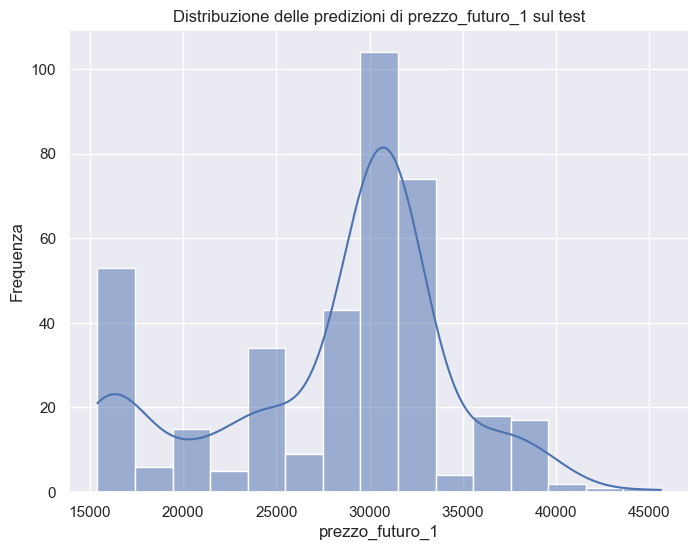

In [90]:
colonna_da_plottare = 'prezzo_futuro_1'

# Crea un istogramma utilizzando seaborn
plt.figure(figsize=(8, 6))
sns.histplot(predizioni_test, kde=True)  # kde=True aggiunge la stima della densità kernel
plt.title(f'Distribuzione delle predizioni di {colonna_da_plottare} sul test')
plt.xlabel(colonna_da_plottare)
plt.ylabel('Frequenza')
plt.show()

### Previsione dati inventati

In [437]:
X_res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113728 entries, 0 to 113727
Data columns (total 52 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Eta_Debitore                                        113728 non-null  float64
 1   RATIO_ONERI_AFF_TOT_AFF                             113728 non-null  float64
 2   Cash Balance                                        113728 non-null  float64
 3   DurataFinanziamentoAnni                             113728 non-null  float64
 4   IMP_FINANZIATO                                      113728 non-null  float64
 5   AgeingErogazioneGg                                  113728 non-null  float64
 6   TOT_AFF                                             113728 non-null  float64
 7   Ratio_Rate_Imp1                                     113728 non-null  float64
 8   DistanzaAffidoUltimoPagamento                       113728 non-n

In [438]:
X_res.iloc[0:1]

,Eta_Debitore,RATIO_ONERI_AFF_TOT_AFF,Cash Balance,DurataFinanziamentoAnni,IMP_FINANZIATO,AgeingErogazioneGg,TOT_AFF,Ratio_Rate_Imp1,DistanzaAffidoUltimoPagamento,AgeingGestioneGg,Sesso_Non Valutabile,Sesso_Uomo,Nazionalita_Italiano,Nazionalita_Non Valutabile,Denominazione Regione_Basilicata,Denominazione Regione_Calabria,Denominazione Regione_Campania,Denominazione Regione_Emilia-Romagna,Denominazione Regione_Friuli-Venezia Giulia,Denominazione Regione_Lazio,Denominazione Regione_Liguria,Denominazione Regione_Lombardia,Denominazione Regione_Marche,Denominazione Regione_Molise,Denominazione Regione_Non Valutabile,Denominazione Regione_Piemonte,Denominazione Regione_Puglia,Denominazione Regione_Sardegna,Denominazione Regione_Sicilia,Denominazione Regione_Toscana,Denominazione Regione_Trentino-Alto Adige/Südtirol,Denominazione Regione_Umbria,Denominazione Regione_Valle d'Aosta/Vallée d'Aoste,Denominazione Regione_Veneto,Metodo_pagamento_RI,NOSTART12M_SI,NOSTART6M_SI,DESCRIZIONE PRODOTTO_ARREDAMENTO,DESCRIZIONE PRODOTTO_AUTOMOTIVE NUOVO,DESCRIZIONE PRODOTTO_AUTOMOTIVE USATO,DESCRIZIONE PRODOTTO_ELETTRONICA & ELETTRODOME,DESCRIZIONE PRODOTTO_FINANZIAMENTI AZIENDE,DESCRIZIONE PRODOTTO_INTERVENTI CASA,DESCRIZIONE PRODOTTO_MOTO E CICLOMOTORI,DESCRIZIONE PRODOTTO_PRESTITI CON TRATTENUTA,DESCRIZIONE PRODOTTO_PRESTITO PERSONALE,DESCRIZIONE PRODOTTO_SPESE MEDICHE,DESCRIZIONE PRODOTTO_TEMPO LIBERO,MACROAREA_Non Valutabile,MACROAREA_Nord_Est,MACROAREA_Nord_Ovest,MACROAREA_Sud_e_Isole
0,43.00,0.09,"3,413.69",5.00,"5,577.00",822.00,131.25,0.45,1.00,15.00,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [ ]:
# dati_inventati = pd.DataFrame({'TOT_AFF': 204.82, 'TOT_ONERI_AFF': 18.62, 'Eta_Debitore':49.894593, 'AgeingErogazioneGg': 1898, 'IMP_FINANZIATO': 16201, 'AgeingGestioneGg': 14}, index=[0])
# modello_scelto.predict_proba(dati_inventati)[0][0]

### Scopro nuove cose

In [439]:
path = modello_scelto.estimators_[0].cost_complexity_pruning_path(X_res, y_res)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [440]:
ccp_alphas

array([0.00000000e+00, 0.00000000e+00, 2.18745953e-07, 3.12636779e-07,
       3.54158851e-07, 4.37460102e-07, 8.43931266e-07, 1.24525861e-06,
       1.29986581e-06, 1.30265324e-06, 1.36080741e-06, 1.36938753e-06,
       1.39652090e-06, 1.58103275e-06, 1.58248392e-06, 1.75492578e-06,
       1.75858188e-06, 1.77023794e-06, 2.13161440e-06, 2.63787282e-06,
       2.63787282e-06, 2.75855981e-06, 2.78577817e-06, 2.82629231e-06,
       2.90654505e-06, 2.93096980e-06, 2.93096980e-06, 2.93096980e-06,
       3.10287419e-06, 3.13216810e-06, 3.22406678e-06, 3.44070368e-06,
       3.46233827e-06, 3.51716376e-06, 3.66371225e-06, 3.66371225e-06,
       3.66908704e-06, 3.71905047e-06, 3.74005598e-06, 3.81026074e-06,
       3.90989054e-06, 4.01961572e-06, 4.12167628e-06, 4.19661585e-06,
       4.35204607e-06, 4.44086333e-06, 4.50918431e-06, 4.54370438e-06,
       4.68955168e-06, 4.68955168e-06, 5.18178316e-06, 5.23387464e-06,
       5.27130029e-06, 5.47114363e-06, 5.82588013e-06, 5.86193960e-06,
      

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

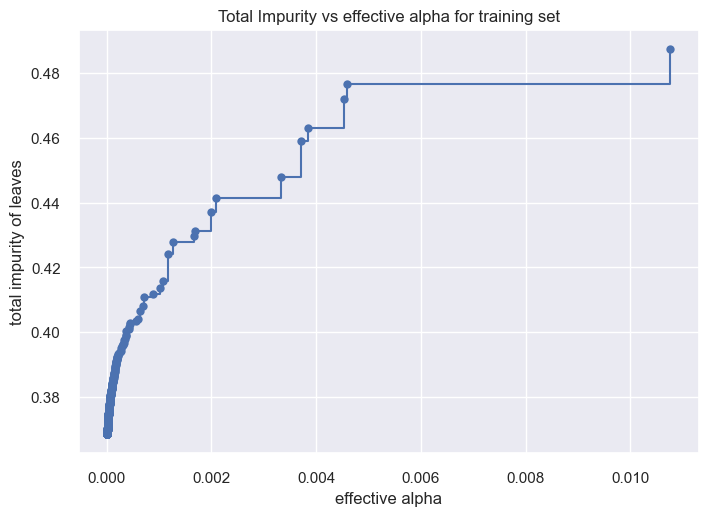

In [441]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")